In [ ]:
# ================================================
# CELL 0 — Configuration and Paths (CLEANED TFRECORDS)
# ================================================

FORCE_REBUILD = True
DISABLE_GPU   = False
MAKE_MAPS     = True
MAKE_PANELS   = True
K_PANELS      = 5

import os, sys
from pathlib import Path

def _pick_first_existing(paths):
    for p in paths:
        if p is None:
            continue
        p = Path(p)
        if p.exists():
            return p.resolve()
    return None

HOME = Path.home()

# --- Project root ---
PROJECT_ROOT = HOME / "Downloads" / "CNN MIL"
PROJECT_ROOT.mkdir(parents=True, exist_ok=True)

# --- TFRecord root (use CLEANED TFRecords) ---
TF_ROOT = _pick_first_existing([
    PROJECT_ROOT / "TFRecords_MIL_CLEAN",  # Cleaned TFRecords first
    PROJECT_ROOT / "TFRecords_MIL",
])

# --- Clusters CSV ---
CLUSTERS_CSV = _pick_first_existing([
    PROJECT_ROOT / "clusters_yeh_spec.csv",
    HOME / "Downloads" / "clusters_yeh_spec.csv",
])

# --- Output directories ---
VALIDATION_DIR = PROJECT_ROOT / "Data Validation"
BAND_OUT_DIR   = VALIDATION_DIR / "Band Analysis"
DD_DIR         = PROJECT_ROOT / "Data Distribution"
NE_CACHE_DIR   = PROJECT_ROOT / "_cache" / "natural_earth"
AUDIT_DIR      = VALIDATION_DIR / "Round Audit"

for p in [VALIDATION_DIR, BAND_OUT_DIR, DD_DIR, NE_CACHE_DIR, AUDIT_DIR]:
    p.mkdir(parents=True, exist_ok=True)

print("=" * 60)
print("MIL VALIDATION PIPELINE (CLEANED TFRECORDS)")
print("=" * 60)
print(f"TF_ROOT      : {TF_ROOT}")
print(f"CLUSTERS_CSV : {CLUSTERS_CSV}")
print(f"DD_DIR       : {DD_DIR}")

if TF_ROOT is None:
    raise FileNotFoundError("Could not find TFRecord directory")
if CLUSTERS_CSV is None:
    raise FileNotFoundError("Could not find clusters_yeh_spec.csv")

MIL VALIDATION PIPELINE (CLEANED TFRECORDS)
TF_ROOT      : C:\Users\d-rosseboe\Downloads\CNN MIL\TFRecords_MIL_CLEAN
CLUSTERS_CSV : C:\Users\d-rosseboe\Downloads\clusters_yeh_spec.csv
DD_DIR       : C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution


In [ ]:
# ================================================
# CELL 1 — Imports and Constants
# ================================================

import math, json, time, pickle, zipfile, io, re
from pathlib import Path
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm.auto import tqdm

try:
    import geopandas as gpd
    import requests
    from sklearn.cluster import dbscan as _dbscan
    from matplotlib.lines import Line2D
except ImportError as e:
    print(f"Optional package missing: {e}")

try:
    from IPython.display import display as nb_display
    from IPython.display import Image as _NBImage, display as _nbdisplay
except:
    nb_display = print
    _NBImage = None
    _nbdisplay = print

if DISABLE_GPU:
    os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
    try:
        tf.config.set_visible_devices([], "GPU")
    except:
        pass

plt.rcParams["figure.dpi"] = 120
print(f"TensorFlow version: {tf.__version__}")

# --- Constants ---
TARGET_SIZE = 224
PATCH = TARGET_SIZE
CROP = TARGET_SIZE
K_TILES = 9
CENTER_PATCH_INDEX = 4
SCALE_M = 30
RADIUS_EARTH = 6356.7523

BANDS_MS = ["BLUE", "GREEN", "RED", "NIR", "SWIR1", "SWIR2", "TEMP1"]
BANDS_ALL = BANDS_MS + ["NIGHTLIGHTS"]
BAND_ORDER = BANDS_ALL[:]

FOLDS = ["A", "B", "C", "D", "E"]
SPLITS = ["train", "val", "test"]

GOOD_LIST_CSV = "good_clusters.csv"
BAD_LIST_CSV = "bad_clusters.csv"

def savefig_dd(name_or_path, dpi=200):
    p = Path(name_or_path)
    if not p.is_absolute():
        p = DD_DIR / p
    p.parent.mkdir(parents=True, exist_ok=True)
    plt.tight_layout()
    plt.savefig(p, dpi=dpi)
    print("Saved figure:", p)

print("Imports and constants loaded.")

TensorFlow version: 2.20.0
Imports and constants loaded.


In [ ]:
# ================================================
# CELL 2 — Discover TFRecord files
# ================================================

tf_files = sorted(list(TF_ROOT.glob("*.tfrecord")))
print(f"Found {len(tf_files)} TFRecord files in {TF_ROOT}")

if len(tf_files) == 0:
    raise FileNotFoundError(f"No .tfrecord files found in {TF_ROOT}")

# Parse country-year from filenames
round_index = []
for tf_path in tf_files:
    m = re.match(r"([A-Z]{2})_(\d{4})_MIL\.tfrecord", tf_path.name, re.IGNORECASE)
    if m:
        cc = m.group(1).upper()
        yr = int(m.group(2))
        round_index.append((cc, yr, str(tf_path)))

print(f"Parsed {len(round_index)} country-year rounds")
for cc, yr, path in round_index[:5]:
    print(f"  {cc}_{yr}: {Path(path).name}")

Found 43 TFRecord files in C:\Users\d-rosseboe\Downloads\CNN MIL\TFRecords_MIL_CLEAN
Parsed 43 country-year rounds
  AO_2023: AO_2023_MIL.tfrecord
  AO_2024: AO_2024_MIL.tfrecord
  BF_2021: BF_2021_MIL.tfrecord
  BJ_2017: BJ_2017_MIL.tfrecord
  BJ_2018: BJ_2018_MIL.tfrecord


In [ ]:
# ================================================
# CELL 2.5 — Clean TFRecords (Filter Corrupt Tiles)
# ================================================
import shutil
from collections import defaultdict

# Define where clean records should go
CLEAN_DIR = PROJECT_ROOT / "TFRecords_MIL_CLEAN"
CLEAN_DIR.mkdir(parents=True, exist_ok=True)

# Check if we need to run cleaning
# (We run if the clean dir is empty OR if FORCE_REBUILD is True)
existing_clean = list(CLEAN_DIR.glob("*.tfrecord"))
need_cleaning = FORCE_REBUILD or (len(existing_clean) == 0)

if not need_cleaning:
    print(f"✅ Clean records already found in: {CLEAN_DIR}")
    print("Skipping cleaning step.")
    # Update TF_ROOT to point to the clean folder
    TF_ROOT = CLEAN_DIR
    tf_files = sorted(list(TF_ROOT.glob("*.tfrecord")))

else:
    print(f"--- STARTING DATA CLEANING ---")
    print(f"Input Source : {TF_ROOT}")
    print(f"Clean Output : {CLEAN_DIR}")

    # Schema for validation
    feature_description = {band: tf.io.VarLenFeature(tf.float32) for band in BANDS_ALL}

    def check_record_validity(raw_bytes):
        """Parses bands and checks for corruption."""
        try:
            example = tf.io.parse_single_example(raw_bytes, feature_description)
            for band in BANDS_ALL:
                data = tf.sparse.to_dense(example[band]).numpy()

                # 1. Check for NaN
                if np.isnan(data).any(): return False, band, "NaN"
                # 2. Check for Inf
                if np.isinf(data).any(): return False, band, "Inf"
                # 3. Check for deep corruption (ignore small negatives like -0.01)
                if data.min() < -1000.0: return False, band, "Negative"
            return True, None, None
        except Exception as e:
            return False, "Parse Error", str(e)

    total_kept = 0
    total_dropped = 0
    global_stats = defaultdict(lambda: {"NaN": 0, "Inf": 0, "Negative": 0, "Other": 0})

    # Use the tf_files list discovered in Cell 2
    for input_file in tqdm(tf_files, desc="Cleaning Shards"):
        filename = input_file.name
        output_path = CLEAN_DIR / filename

        raw_dataset = tf.data.TFRecordDataset(str(input_file))

        with tf.io.TFRecordWriter(str(output_path)) as writer:
            for raw_record in raw_dataset:
                is_valid, bad_band, reason = check_record_validity(raw_record.numpy())

                if is_valid:
                    writer.write(raw_record.numpy())
                    total_kept += 1
                else:
                    total_dropped += 1
                    if bad_band in BANDS_ALL:
                        global_stats[bad_band][reason] += 1
                    else:
                        global_stats["SYSTEM"]["Other"] += 1

    print("\n" + "=" * 60)
    print("CLEANING SUMMARY")
    print("=" * 60)
    print(f"Total Kept    : {total_kept}")
    print(f"Total Dropped : {total_dropped}")

    if total_dropped > 0:
        print("-" * 55)
        print(f"{'BAND':<15} | {'NaN':<8} | {'Inf':<8} | {'Negative':<8} | {'TOTAL':<8}")
        print("-" * 55)
        sorted_bands = sorted(global_stats.items(), key=lambda x: sum(x[1].values()), reverse=True)
        for band, counts in sorted_bands:
            total = sum(counts.values())
            print(f"{band:<15} | {counts['NaN']:<8} | {counts['Inf']:<8} | {counts['Negative']:<8} | {total:<8}")
    else:
        print("✨ No corruptions found.")
    print("=" * 60)

    # UPDATE GLOBAL PATHS
    TF_ROOT = CLEAN_DIR
    tf_files = sorted(list(TF_ROOT.glob("*.tfrecord")))
    print(f"✅ TF_ROOT updated to: {TF_ROOT}")

In [ ]:
# ================================================
# CELL 3 — One-pass scan of TFRecords + compute band statistics
# ================================================

BAND_JSON = BAND_OUT_DIR / "band_stats_summary.json"
BAND_CSV = BAND_OUT_DIR / "band_stats_summary.csv"
PICKLE_OUT = DD_DIR / "tfrecord_scan_records.pkl"
NPZ_ARRAYS_OUT = DD_DIR / "tfrecord_scan_arrays.npz"
KEYMAP_PKL = DD_DIR / "tfrecord_key_to_path.pkl"
MANIFEST = DD_DIR / "scan_manifest.json"

need_scan = FORCE_REBUILD or not all([
    BAND_JSON.exists(), BAND_CSV.exists(),
    PICKLE_OUT.exists(), NPZ_ARRAYS_OUT.exists(),
    KEYMAP_PKL.exists(), MANIFEST.exists()
])

# Feature description for parsing TFRecords
feature_description = {
    "country": tf.io.FixedLenFeature([], tf.string),
    "year": tf.io.FixedLenFeature([], tf.int64),
    "cluster": tf.io.FixedLenFeature([], tf.int64),
    "cluster_index": tf.io.FixedLenFeature([], tf.int64),
    "K": tf.io.FixedLenFeature([], tf.int64),
    "patch_size": tf.io.FixedLenFeature([], tf.int64),
}
for band in BANDS_ALL:
    feature_description[band] = tf.io.VarLenFeature(tf.float32)

def parse_tfrecord(raw_record):
    """Parse a single TFRecord example."""
    return tf.io.parse_single_example(raw_record, feature_description)

if not need_scan:
    print("Loading cached scan results...")
    band_stats_json = json.loads(BAND_JSON.read_text())
    scan_records = pickle.loads(PICKLE_OUT.read_bytes())
    npz_data = np.load(NPZ_ARRAYS_OUT)
    years_arr = npz_data["years"]
    nls_center_arr = npz_data["nls_center"]
    nls_mean_arr = npz_data["nls_mean"]
    key_to_path = pickle.loads(KEYMAP_PKL.read_bytes())
else:
    print(f"Scanning {len(tf_files)} TFRecord files...")

    # Initialize band statistics
    band_aggs = {band: {"count": 0, "sum": 0.0, "sum_sq": 0.0,
                        "min": float("inf"), "max": float("-inf")}
                 for band in BANDS_ALL}

    scan_records = []
    key_to_path = {}
    cluster_stats = defaultdict(lambda: {"n": 0, "n_bad": 0})

    NL_INDEX = BANDS_ALL.index("NIGHTLIGHTS")
    RED_INDEX = BANDS_ALL.index("RED")

    total_records = 0
    record_idx_in_file = {}  # Track index within each file

    for tf_path in tqdm(tf_files, desc="Scanning TFRecords"):
        tf_path_str = str(tf_path)
        record_idx_in_file[tf_path_str] = 0

        dataset = tf.data.TFRecordDataset(tf_path_str)

        for raw_record in dataset:
            example = parse_tfrecord(raw_record)

            cc = example["country"].numpy().decode("utf-8").upper()[:2]
            yr = int(example["year"].numpy())
            clu = int(example["cluster"].numpy())
            K = int(example["K"].numpy())
            H = int(example["patch_size"].numpy())

            key = (cc, yr, clu)
            total_records += 1

            # Store path mapping
            if key not in key_to_path:
                key_to_path[key] = {
                    "path": tf_path_str,
                    "index": record_idx_in_file[tf_path_str]
                }

            # Parse bands and compute statistics
            band_data = {}
            for band in BANDS_ALL:
                arr = tf.sparse.to_dense(example[band]).numpy()
                band_data[band] = arr

                # Update statistics (only finite values)
                valid = arr[np.isfinite(arr)]
                if len(valid) > 0:
                    band_aggs[band]["count"] += len(valid)
                    band_aggs[band]["sum"] += valid.sum()
                    band_aggs[band]["sum_sq"] += (valid ** 2).sum()
                    band_aggs[band]["min"] = min(band_aggs[band]["min"], valid.min())
                    band_aggs[band]["max"] = max(band_aggs[band]["max"], valid.max())

            # NL center/mean from center patch
            nl_arr = band_data["NIGHTLIGHTS"]
            if nl_arr.size == K * H * H:
                nl_cube = nl_arr.reshape(K, H, H)
                center_patch = nl_cube[CENTER_PATCH_INDEX]
                nl_center = float(center_patch[H//2, H//2])
                nl_mean = float(np.nanmean(center_patch))
            else:
                nl_center = float("nan")
                nl_mean = float("nan")

            # Good example check (RED band)
            red_arr = band_data["RED"]
            if red_arr.size == K * H * H:
                red_cube = red_arr.reshape(K, H, H)
                valid_red = np.isfinite(red_cube) & (red_cube != 0)
                good_example = bool(valid_red.mean() >= 0.20)
            else:
                good_example = False

            cluster_stats[key]["n"] += 1
            if not good_example:
                cluster_stats[key]["n_bad"] += 1

            scan_records.append({
                "country": cc,
                "year": yr,
                "cluster": clu,
                "nls_center": nl_center,
                "nls_mean": nl_mean,
                "good_example": good_example,
                "tf_path": tf_path_str,
            })

            record_idx_in_file[tf_path_str] += 1

    # Compute final statistics
    print("\n" + "=" * 60)
    print("BAND STATISTICS")
    print("=" * 60)

    rows = []
    print(f"\n{'Band':<12} {'Count':>14} {'Mean':>12} {'Std':>12} {'Min':>12} {'Max':>12}")
    print("-" * 76)

    for band in BANDS_ALL:
        agg = band_aggs[band]
        n = agg["count"]

        if n > 0:
            mean = agg["sum"] / n
            variance = (agg["sum_sq"] / n) - (mean ** 2)
            variance = max(0.0, variance)
            std = np.sqrt(variance)
            bmin = agg["min"]
            bmax = agg["max"]
        else:
            mean = std = bmin = bmax = float("nan")

        # --- FIX: Cast to float/int explicitly for JSON serialization ---
        rows.append({
            "band": band,
            "n_pixels": int(n),
            "global_mean": float(mean),
            "global_std": float(std),
            "min": float(bmin),
            "max": float(bmax),
        })

        print(f"{band:<12} {n:>14,} {mean:>12.6f} {std:>12.6f} {bmin:>12.6f} {bmax:>12.6f}")

    df_stats = pd.DataFrame(rows)

    # Save band stats JSON
    band_stats_json = {
        r["band"]: {"global_mean": r["global_mean"], "global_std": r["global_std"]}
        for r in rows
    }
    BAND_JSON.write_text(json.dumps(band_stats_json, indent=2))
    df_stats.to_csv(BAND_CSV, index=False)

    # Save scan records
    df_rec = pd.DataFrame(scan_records)
    years_arr = df_rec["year"].values.astype(np.int32)
    nls_center_arr = df_rec["nls_center"].values.astype(np.float32)
    nls_mean_arr = df_rec["nls_mean"].values.astype(np.float32)

    PICKLE_OUT.write_bytes(pickle.dumps(scan_records))
    np.savez_compressed(NPZ_ARRAYS_OUT, years=years_arr, nls_center=nls_center_arr, nls_mean=nls_mean_arr)
    KEYMAP_PKL.write_bytes(pickle.dumps(key_to_path))

    # Save manifest
    good_keys = [k for k, st in cluster_stats.items() if st["n"] > 0 and st["n_bad"] == 0]
    bad_keys = [k for k, st in cluster_stats.items() if st["n"] > 0 and st["n_bad"] > 0]

    MANIFEST.write_text(json.dumps({
        "tf_root": str(TF_ROOT),
        "n_files": len(tf_files),
        "n_records": total_records,
        "n_unique_keys": len(cluster_stats),
        "n_good_keys": len(good_keys),
        "n_bad_keys": len(bad_keys),
        "timestamp_utc": time.strftime("%Y-%m-%dT%H:%M:%SZ", time.gmtime()),
    }, indent=2))

    print(f"\nSaved:")
    print(f"  - {BAND_JSON}")
    print(f"  - {BAND_CSV}")
    print(f"  - {PICKLE_OUT}")
    print(f"  - {KEYMAP_PKL}")
    print(f"  - {MANIFEST}")

print(f"\nTotal scan records: {len(scan_records)}")
print(f"Total unique keys: {len(key_to_path)}")

Scanning 43 TFRecord files...


Scanning TFRecords: 100%|██████████████████████████████████████████████████████████████| 43/43 [09:03<00:00, 12.65s/it]


BAND STATISTICS

Band                  Count         Mean          Std          Min          Max
----------------------------------------------------------------------------
BLUE          6,570,547,200     0.059608     0.034169    -0.181641     0.970703
GREEN         6,570,547,200     0.102835     0.051580    -0.085144     0.880371
RED           6,570,547,200     0.125929     0.084266    -0.060699     0.926758
NIR           6,570,547,200     0.279550     0.081496    -0.044037     1.141602
SWIR1         6,570,547,200     0.278512     0.128159    -0.002771     1.528320
SWIR2         6,570,547,200     0.199782     0.120841     0.000527     1.567383
TEMP1         6,570,547,200   309.151398     5.798033   245.250000   341.500000
NIGHTLIGHTS   6,570,547,200     0.459045     0.406542     0.140503     4.507812

Saved:
  - C:\Users\d-rosseboe\Downloads\CNN MIL\Data Validation\Band Analysis\band_stats_summary.json
  - C:\Users\d-rosseboe\Downloads\CNN MIL\Data Validation\Band Analysis\band_stat

In [ ]:
# ================================================
# CELL 4 — Build dhs_loc_dict.pkl from clusters CSV
# ================================================

LOC_DICT_PATH = DD_DIR / "dhs_loc_dict.pkl"

# Load clusters CSV
df_loc = pd.read_csv(CLUSTERS_CSV, float_precision="high")

# Normalize columns
df_loc["country"] = df_loc["country"].astype(str).str.upper().str[:2]
df_loc["year"] = pd.to_numeric(df_loc["year"], errors="coerce").astype("Int64")

if "cluster" in df_loc.columns and "cluster_index" not in df_loc.columns:
    df_loc = df_loc.rename(columns={"cluster": "cluster_index"})
if "cluster_index" not in df_loc.columns:
    raise ValueError("clusters CSV must contain 'cluster' or 'cluster_index'")

df_loc["cluster_index"] = pd.to_numeric(df_loc["cluster_index"], errors="coerce").astype("Int64")

# Handle n_households
if "n_households" not in df_loc.columns and "households" in df_loc.columns:
    df_loc = df_loc.rename(columns={"households": "n_households"})

# Required columns
required = ["country", "year", "cluster_index", "wealthpooled", "lat", "lon"]
missing = [c for c in required if c not in df_loc.columns]
if missing:
    raise ValueError(f"clusters CSV missing columns: {missing}")

# Convert types
df_loc["wealthpooled"] = pd.to_numeric(df_loc["wealthpooled"], errors="coerce")
df_loc["lat"] = pd.to_numeric(df_loc["lat"], errors="coerce")
df_loc["lon"] = pd.to_numeric(df_loc["lon"], errors="coerce")

if "n_households" in df_loc.columns:
    df_loc["n_households"] = pd.to_numeric(df_loc["n_households"], errors="coerce").fillna(0).astype(int)
else:
    df_loc["n_households"] = 0

# Urban handling
if "urban" in df_loc.columns:
    if df_loc["urban"].dtype == object:
        df_loc["urban"] = (df_loc["urban"].astype(str).str.upper() == "U")
    else:
        df_loc["urban"] = (pd.to_numeric(df_loc["urban"], errors="coerce").fillna(0).astype(int) == 1)
else:
    df_loc["urban"] = False

# Drop NaN and duplicates
df_loc = df_loc.dropna(subset=["country", "year", "cluster_index", "lat", "lon"]).copy()
df_loc = df_loc.drop_duplicates(subset=["country", "year", "cluster_index"], keep="first")

print(f"Clusters in CSV after cleaning: {len(df_loc)}")

# Get keys from TFRecord scan
tfrecord_keys = set(key_to_path.keys())
print(f"Unique keys in TFRecords: {len(tfrecord_keys)}")

# Build loc_dict
loc_dict = {}
skipped = 0

for _, r in df_loc.iterrows():
    key = (str(r["country"]), int(r["year"]), int(r["cluster_index"]))

    if key not in tfrecord_keys:
        skipped += 1
        continue

    loc_dict[key] = {
        "lat": float(r["lat"]),
        "lon": float(r["lon"]),
        "country": str(r["country"]),
        "year": int(r["year"]),
        "cluster": int(r["cluster_index"]),
        "households": int(r["n_households"]),
        "urban": bool(r["urban"]),
        "wealthpooled": float(r["wealthpooled"]),
    }

LOC_DICT_PATH.write_bytes(pickle.dumps(loc_dict))

print(f"\nSaved: {LOC_DICT_PATH}")
print(f"loc_dict entries: {len(loc_dict)}")
print(f"Skipped (not in TFRecords): {skipped}")

Clusters in CSV after cleaning: 16693
Unique keys in TFRecords: 14550

Saved: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\dhs_loc_dict.pkl
loc_dict entries: 14550
Skipped (not in TFRecords): 2143


In [ ]:
# ================================================
# CELL 5 — Build dhs_combined_df.csv
# ================================================

OUT_CSV = DD_DIR / "dhs_combined_df.csv"

# Build dataframe
rows = []
missing_loc = 0

for rec in scan_records:
    key = (rec["country"], rec["year"], rec["cluster"])

    if key not in loc_dict:
        missing_loc += 1
        continue

    loc = loc_dict[key]

    rows.append({
        "country": rec["country"],
        "year": rec["year"],
        "cluster": rec["cluster"],
        "cluster_index": rec["cluster"],
        "lat": loc["lat"],
        "lon": loc["lon"],
        "wealthpooled": loc["wealthpooled"],
        "urban": int(loc["urban"]),
        "households": loc["households"],
        "nl_center": rec["nls_center"],
        "nl_mean": rec["nls_mean"],
        "good_example": rec["good_example"],
    })

df = pd.DataFrame(rows)

print(f"Combined dataframe: {len(df)} rows")
print(f"Missing location info: {missing_loc}")

df.to_csv(OUT_CSV, index=False)
print(f"\nSaved: {OUT_CSV}")

nb_display(df.head())
nb_display(df.describe())

# Create LOCS array for fold creation
LOCS = df[["lat", "lon"]].to_numpy(dtype=np.float32)
print(f"\nLOCS shape: {LOCS.shape}")

Combined dataframe: 14550 rows
Missing location info: 0

Saved: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\dhs_combined_df.csv


,country,year,cluster,cluster_index,lat,lon,wealthpooled,urban,households,nl_center,nl_mean,good_example
0,AO,2023,9,9,-8.815073,13.222358,1.875664,1,26,1.583008,1.583005,True
1,AO,2023,10,10,-7.056987,15.345483,-1.290900,0,26,0.279053,0.279020,True
2,AO,2023,31,31,-8.691715,14.434650,0.371086,0,26,0.485107,0.485365,True
3,AO,2023,13,13,-11.951780,19.888152,-1.213844,0,20,0.277100,0.277175,True
4,AO,2023,38,38,-7.710122,15.452149,-1.100722,0,26,0.280273,0.280320,True


,year,cluster,cluster_index,lat,lon,wealthpooled,urban,households,nl_center,nl_mean
count,14550.000000,14550.000000,14550.000000,14550.000000,14550.000000,14550.000000,14550.000000,14550.000000,14550.000000,14550.000000
mean,2020.698282,432.567491,432.567491,4.245414,7.564310,0.022385,0.416632,24.431134,0.459106,0.459079
std,2.249437,365.005627,365.005627,11.488868,18.788398,0.836272,0.493018,6.524440,0.406536,0.406440
min,2017.000000,1.000000,1.000000,-30.501175,-17.485937,-1.579571,0.000000,1.000000,0.140747,0.140782
25%,2018.000000,164.000000,164.000000,-0.500598,-9.480462,-0.716398,0.000000,22.000000,0.266846,0.266715
50%,2021.000000,328.000000,328.000000,7.398320,4.908185,-0.038551,0.000000,25.000000,0.332520,0.332486
75%,2023.000000,574.000000,574.000000,12.532371,22.552145,0.744428,1.000000,29.000000,0.468506,0.468638
max,2024.000000,1685.000000,1685.000000,25.422785,50.300383,2.496161,1.000000,36.000000,4.339844,4.337644



LOCS shape: (14550, 2)


In [ ]:
# ================================================
# CELL 6 — Create OOC (Out-of-Country) Folds
# ================================================

OOC_FOLDS_PATH = DD_DIR / "dhs_ooc_folds.pkl"

need_ooc = FORCE_REBUILD or not OOC_FOLDS_PATH.exists()

if need_ooc:
    print("Creating OOC folds...")

    COUNTRIES = np.array(sorted(df["country"].unique()))
    print(f"Countries: {len(COUNTRIES)} -> {list(COUNTRIES)}")

    # Build country -> indices mapping
    country_indices = defaultdict(list)
    for i in range(len(df)):
        country_indices[df["country"].iloc[i]].append(i)

    for c in country_indices:
        country_indices[c] = np.asarray(country_indices[c], dtype=np.int64)

    def make_ooc_folds_balanced(country_indices, folds=FOLDS):
        """Distribute countries across folds, balancing by sample count."""
        order = sorted(country_indices.items(), key=lambda kv: len(kv[1]), reverse=True)

        fold_countries = {f: [] for f in folds}
        for i, (cc, _) in enumerate(order):
            fold_countries[folds[i % len(folds)]].append(cc)

        ooc = {f: {s: None for s in SPLITS} for f in folds}

        for f in folds:
            test_countries = fold_countries[f]
            val_countries = fold_countries[folds[(folds.index(f) + 1) % len(folds)]]
            train_countries = [c for c in COUNTRIES if c not in set(test_countries + val_countries)]

            test_idx = np.sort(np.concatenate([country_indices[c] for c in test_countries])) if test_countries else np.array([], dtype=np.int64)
            val_idx = np.sort(np.concatenate([country_indices[c] for c in val_countries])) if val_countries else np.array([], dtype=np.int64)
            train_idx = np.sort(np.concatenate([country_indices[c] for c in train_countries])) if train_countries else np.array([], dtype=np.int64)

            ooc[f]["test"] = test_idx
            ooc[f]["val"] = val_idx
            ooc[f]["train"] = train_idx

        return ooc

    ooc_folds = make_ooc_folds_balanced(country_indices)
    OOC_FOLDS_PATH.write_bytes(pickle.dumps(ooc_folds))
    print(f"Saved: {OOC_FOLDS_PATH}")
else:
    ooc_folds = pickle.loads(OOC_FOLDS_PATH.read_bytes())
    print(f"Loaded: {OOC_FOLDS_PATH}")

print("\nOOC Fold Summary:")
print(f"{'Fold':<6} {'Train':>8} {'Val':>8} {'Test':>8}")
print("-" * 34)
for f in FOLDS:
    print(f"{f:<6} {len(ooc_folds[f]['train']):>8} {len(ooc_folds[f]['val']):>8} {len(ooc_folds[f]['test']):>8}")

Creating OOC folds...
Countries: 22 -> [np.str_('AO'), np.str_('BF'), np.str_('BJ'), np.str_('CD'), np.str_('CI'), np.str_('CM'), np.str_('GA'), np.str_('GH'), np.str_('GM'), np.str_('GN'), np.str_('KE'), np.str_('LB'), np.str_('LS'), np.str_('MD'), np.str_('ML'), np.str_('MR'), np.str_('MZ'), np.str_('NG'), np.str_('SL'), np.str_('SN'), np.str_('TZ'), np.str_('ZM')]
Saved: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\dhs_ooc_folds.pkl

OOC Fold Summary:
Fold      Train      Val     Test
----------------------------------
A          7151     2962     4437
B          8972     2616     2962
C          9409     2525     2616
D         10015     2010     2525
E          8103     4437     2010


In [ ]:
# ================================================
# CELL 7 — Create In-Country Folds (DBSCAN clustering)
# ================================================

INC_FOLDS_PATH = DD_DIR / "dhs_incountry_folds.pkl"

need_inc = FORCE_REBUILD or not INC_FOLDS_PATH.exists()

def get_lat_for_distance_km(d_km):
    return (d_km / RADIUS_EARTH) * 180.0 / np.pi

def get_lon_for_distance_km(lat_deg, d_km):
    r = RADIUS_EARTH * np.cos(np.abs(lat_deg) * np.pi / 180.0)
    return (d_km / r) * 180.0 / np.pi

def create_folds_dbscan(locs, min_dist, fold_names):
    """Create folds using DBSCAN to keep nearby locations together."""
    locs = np.asarray(locs, dtype=float)

    locs_to_indices = defaultdict(list)
    for i, loc in enumerate(locs):
        locs_to_indices[tuple(loc)].append(i)

    uniq = np.unique(locs, axis=0)
    _, labels = _dbscan(X=uniq, eps=min_dist, min_samples=2, metric="euclidean")

    clusters = defaultdict(list)
    neg = -1
    for u, c in zip(uniq, labels):
        idxs = locs_to_indices[tuple(u)]
        if c < 0:
            c = neg
            neg -= 1
        clusters[c].extend(idxs)

    ordered = sorted(clusters.keys(), key=lambda c: -len(clusters[c]))
    fold_bins = {f: [] for f in fold_names}

    for c in ordered:
        f = min(fold_bins, key=lambda k: len(fold_bins[k]))
        fold_bins[f].extend(clusters[c])

    for f in fold_bins:
        fold_bins[f] = np.sort(np.asarray(fold_bins[f], dtype=np.int64))

    return fold_bins

if need_inc:
    print("Creating in-country folds...")

    side_km = CROP * SCALE_M / 1000.0
    far_lat = float(max(abs(LOCS[:, 0].min()), abs(LOCS[:, 0].max())))
    side_lat = get_lat_for_distance_km(side_km)
    side_lon = get_lon_for_distance_km(far_lat, side_km)
    MIN_DIST = float(math.hypot(side_lat, side_lon))

    print(f"Patch side: {side_km:.2f} km")
    print(f"Min distance threshold: {MIN_DIST:.6f} degrees")

    test_folds = create_folds_dbscan(LOCS, min_dist=MIN_DIST, fold_names=FOLDS)

    incountry_folds = {}
    for i, f in enumerate(FOLDS):
        incountry_folds[f] = {}
        incountry_folds[f]["test"] = np.asarray(test_folds[f], dtype=np.int64)
        val_f = FOLDS[(i + 1) % len(FOLDS)]
        incountry_folds[f]["val"] = np.asarray(test_folds[val_f], dtype=np.int64)
        train_fs = [FOLDS[(i + 2) % 5], FOLDS[(i + 3) % 5], FOLDS[(i + 4) % 5]]
        incountry_folds[f]["train"] = np.sort(np.concatenate([
            np.asarray(test_folds[x], dtype=np.int64) for x in train_fs
        ]))

    INC_FOLDS_PATH.write_bytes(pickle.dumps(incountry_folds))
    print(f"Saved: {INC_FOLDS_PATH}")
else:
    incountry_folds = pickle.loads(INC_FOLDS_PATH.read_bytes())
    print(f"Loaded: {INC_FOLDS_PATH}")

print("\nIn-Country Fold Summary:")
print(f"{'Fold':<6} {'Train':>8} {'Val':>8} {'Test':>8}")
print("-" * 34)
for f in FOLDS:
    print(f"{f:<6} {len(incountry_folds[f]['train']):>8} {len(incountry_folds[f]['val']):>8} {len(incountry_folds[f]['test']):>8}")

Creating in-country folds...
Patch side: 6.72 km
Min distance threshold: 0.092793 degrees
Saved: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\dhs_incountry_folds.pkl

In-Country Fold Summary:
Fold      Train      Val     Test
----------------------------------
A          8730     2910     2910
B          8730     2910     2910
C          8730     2910     2910
D          8730     2910     2910
E          8730     2910     2910


In [ ]:
# ================================================
# CELL 8 — Write GOOD/BAD audit lists per country-year
# ================================================

print("Writing audit lists per country-year...")

# Get expected clusters from CSV
cl = pd.read_csv(CLUSTERS_CSV, float_precision="high")
cl["country"] = cl["country"].astype(str).str.upper().str[:2]
cl["year"] = pd.to_numeric(cl["year"], errors="coerce").astype("Int64")

if "cluster_index" not in cl.columns and "cluster" in cl.columns:
    cl = cl.rename(columns={"cluster": "cluster_index"})
cl["cluster_index"] = pd.to_numeric(cl["cluster_index"], errors="coerce").astype("Int64")
cl = cl.dropna(subset=["country", "year", "cluster_index"]).copy()

expected_by_round = {
    k: set(g["cluster_index"].astype(int).tolist())
    for k, g in cl.groupby(["country", "year"])
}

# Get observed clusters from scan
observed_by_round = defaultdict(set)
for rec in scan_records:
    key_round = (rec["country"], rec["year"])
    observed_by_round[key_round].add(rec["cluster"])

# Write audit files
written = 0
for (cc, yr), expected in tqdm(expected_by_round.items(), desc="Writing audit files"):
    out_dir = AUDIT_DIR / f"{cc}_{yr}"
    out_dir.mkdir(parents=True, exist_ok=True)

    observed = observed_by_round.get((cc, yr), set())
    missing = sorted(expected - observed)
    good = sorted(expected & observed)

    pd.DataFrame({"cluster_index": good}).to_csv(out_dir / GOOD_LIST_CSV, index=False)
    pd.DataFrame([
        {"cluster_index": int(ci), "reason": "missing_in_tfrecords", "n_bad_examples": 1}
        for ci in missing
    ]).to_csv(out_dir / BAD_LIST_CSV, index=False)

    written += 1

print(f"Wrote audit files for {written} country-year combinations")

Writing audit lists per country-year...


Writing audit files: 100%|████████████████████████████████████████████████████████████| 43/43 [00:00<00:00, 400.35it/s]

Wrote audit files for 43 country-year combinations


Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\africa_ooc_test_folds.png


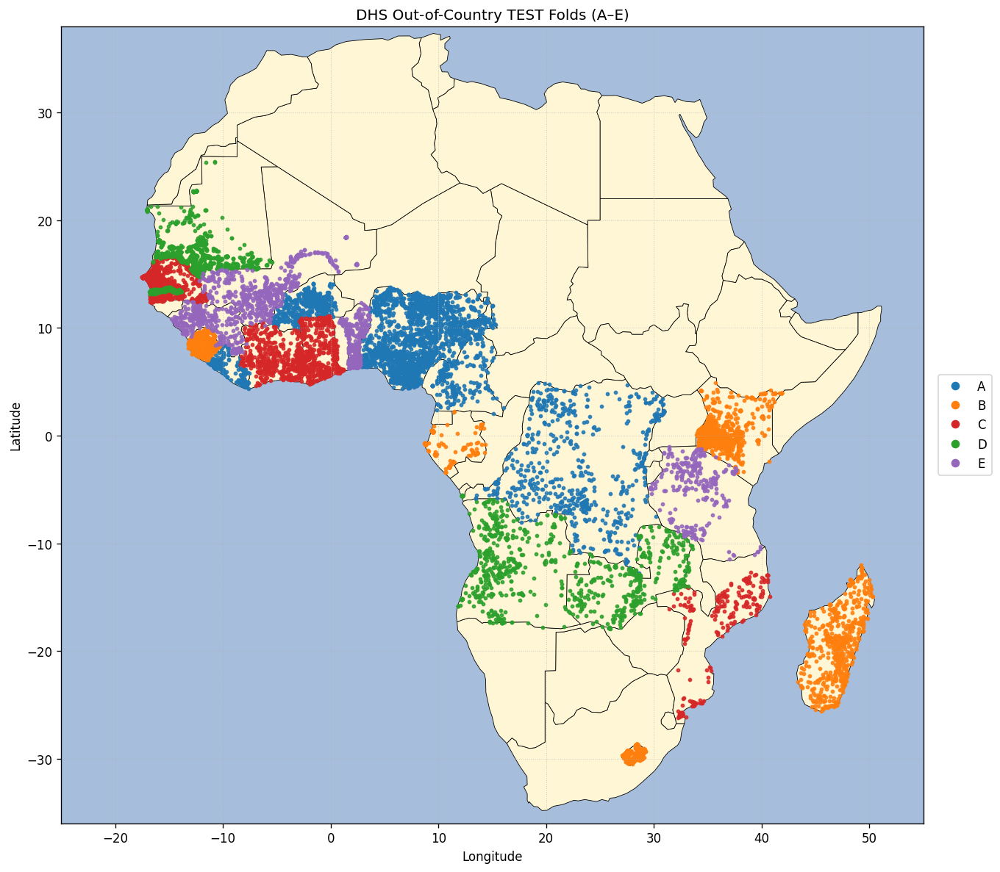

In [ ]:
# ================================================
# CELL 9 — Plot OOC Folds on Africa Map
# ================================================

try:
    NE110_URL = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
    world = gpd.read_file(NE110_URL)
    africa = world[world["CONTINENT"] == "Africa"].to_crs("EPSG:4326")

    FOLD_COLORS = {"A": "#1f77b4", "B": "#ff7f0e", "C": "#d62728", "D": "#2ca02c", "E": "#9467bd"}

    fig, ax = plt.subplots(figsize=(14, 10))
    ax.set_facecolor("#a6bddb")
    africa.plot(ax=ax, color="#fff6d5", edgecolor="black", linewidth=0.5)

    for f in FOLDS:
        idx = np.asarray(ooc_folds[f]["test"], dtype=int)
        if idx.size > 0:
            ax.scatter(LOCS[idx, 1], LOCS[idx, 0], s=6, c=FOLD_COLORS[f], label=f, alpha=0.85)

    handles = [Line2D([0], [0], marker="o", color="w", markerfacecolor=FOLD_COLORS[f],
                      markersize=8, linestyle="") for f in FOLDS]
    ax.legend(handles, FOLDS, loc="center left", bbox_to_anchor=(1.01, 0.5))
    ax.set_xlim(-25, 55)
    ax.set_ylim(-36, 38)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_title("DHS Out-of-Country TEST Folds (A–E)")
    ax.grid(True, linestyle=":", linewidth=0.6, alpha=0.6)

    savefig_dd("africa_ooc_test_folds.png")
    plt.show()
except Exception as e:
    print(f"Could not create OOC map: {e}")

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\africa_incountry_test_folds.png


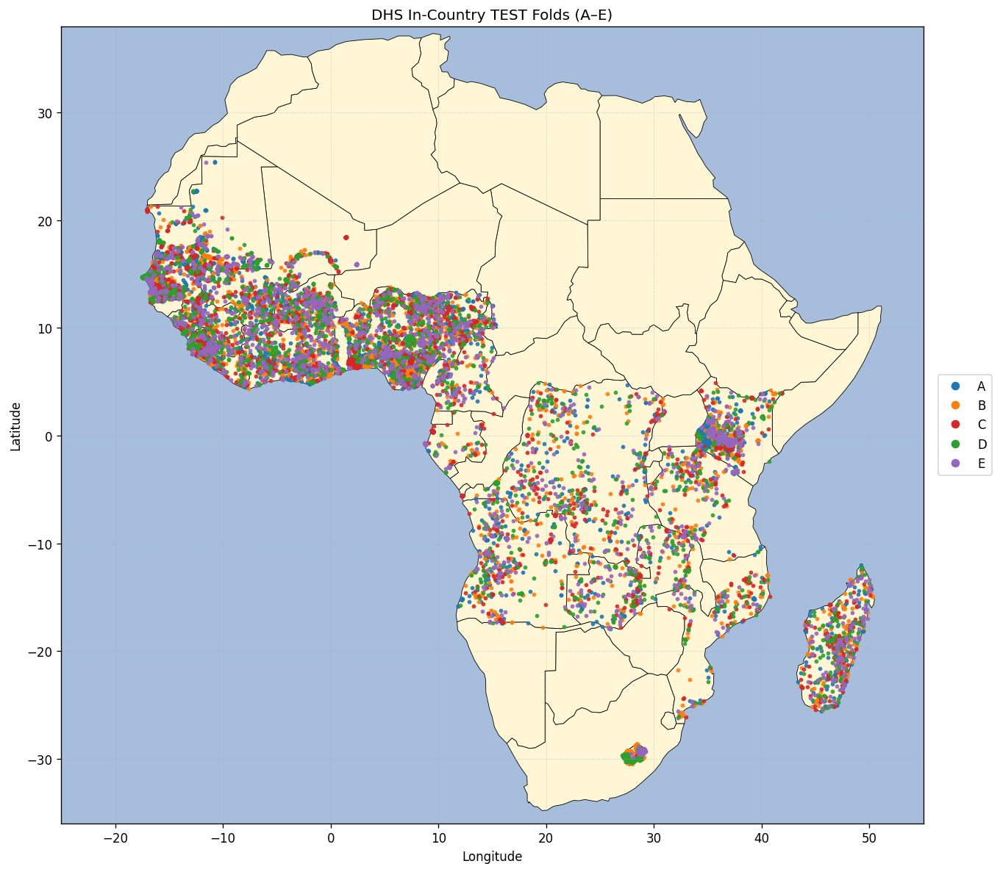

In [ ]:
# ================================================
# CELL 10 — Plot In-Country Folds on Africa Map
# ================================================

try:
    fig, ax = plt.subplots(figsize=(14, 10))
    ax.set_facecolor("#a6bddb")
    africa.plot(ax=ax, color="#fff6d5", edgecolor="black", linewidth=0.5)

    for f in FOLDS:
        idx = np.asarray(incountry_folds[f]["test"], dtype=int)
        if idx.size > 0:
            ax.scatter(LOCS[idx, 1], LOCS[idx, 0], s=6, c=FOLD_COLORS[f], label=f, alpha=0.85)

    handles = [Line2D([0], [0], marker="o", color="w", markerfacecolor=FOLD_COLORS[f],
                      markersize=8, linestyle="") for f in FOLDS]
    ax.legend(handles, FOLDS, loc="center left", bbox_to_anchor=(1.01, 0.5))
    ax.set_xlim(-25, 55)
    ax.set_ylim(-36, 38)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_title("DHS In-Country TEST Folds (A–E)")
    ax.grid(True, linestyle=":", linewidth=0.6, alpha=0.6)

    savefig_dd("africa_incountry_test_folds.png")
    plt.show()
except Exception as e:
    print(f"Could not create in-country map: {e}")

Plotting maps for 43 country-year combinations


Plotting maps:   0%|                                                                            | 0/43 [00:00<?, ?it/s]

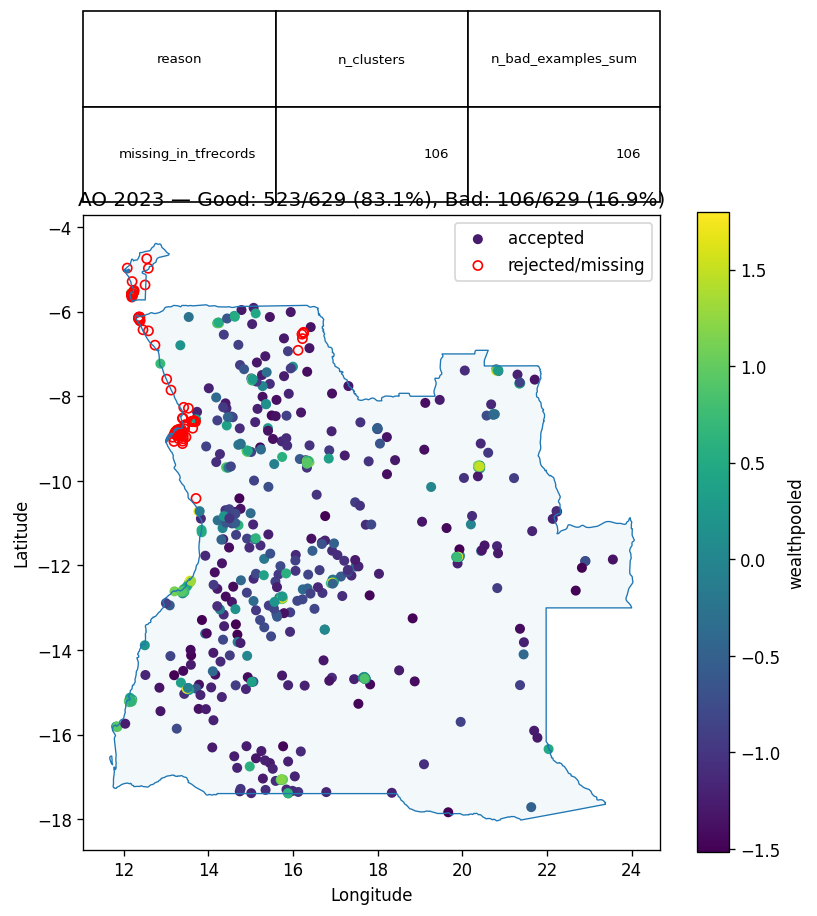

Plotting maps:   2%|█▌                                                                  | 1/43 [00:00<00:10,  3.84it/s]

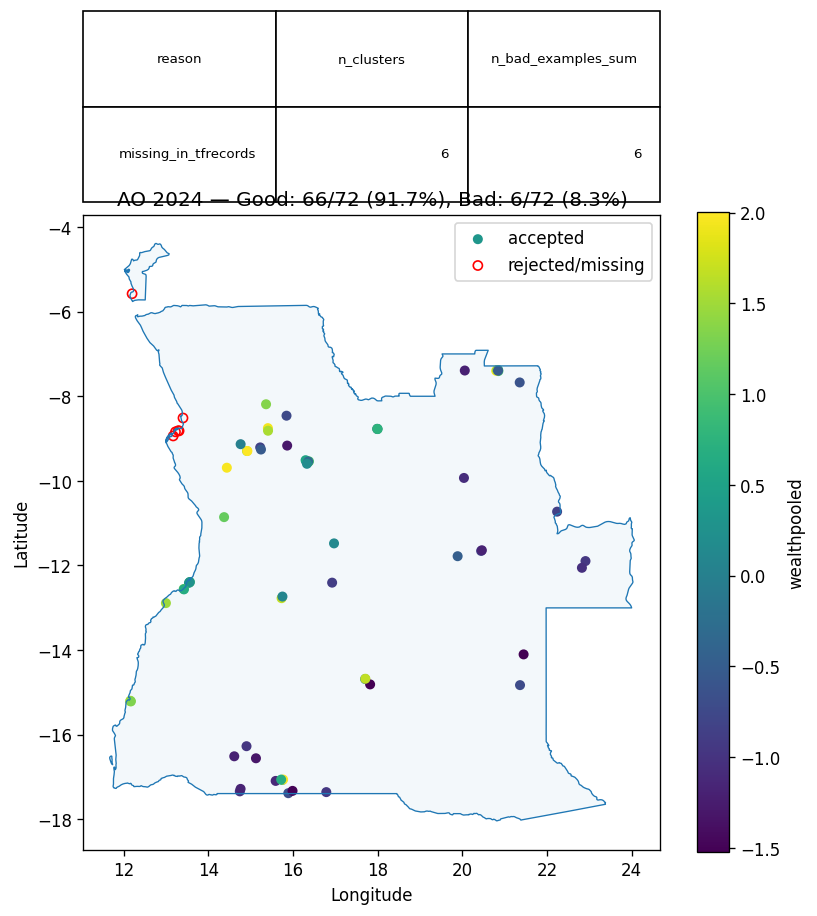

Plotting maps:   5%|███▏                                                                | 2/43 [00:00<00:10,  3.82it/s]

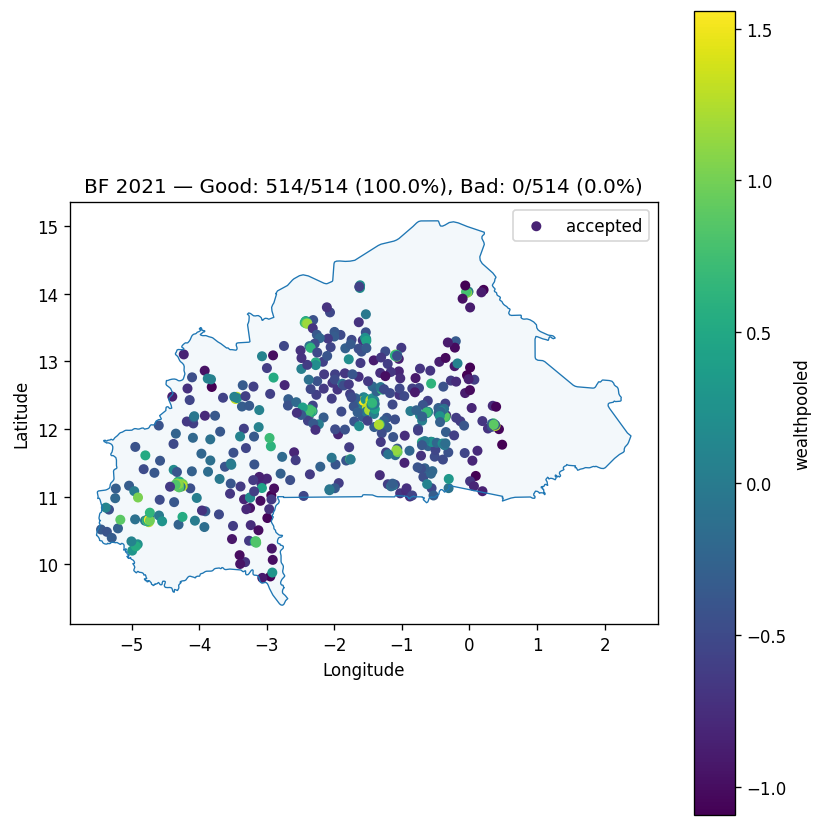

Plotting maps:   7%|████▋                                                               | 3/43 [00:00<00:09,  4.18it/s]

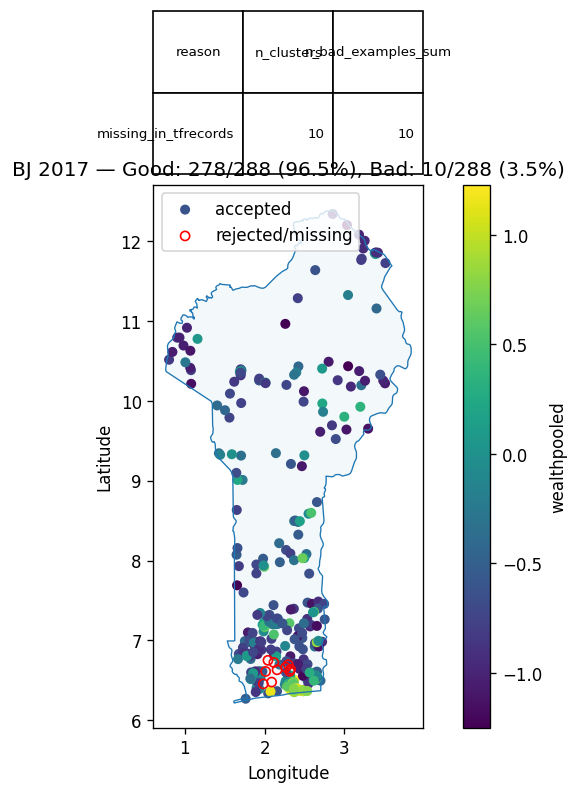

Plotting maps:   9%|██████▎                                                             | 4/43 [00:00<00:09,  4.10it/s]

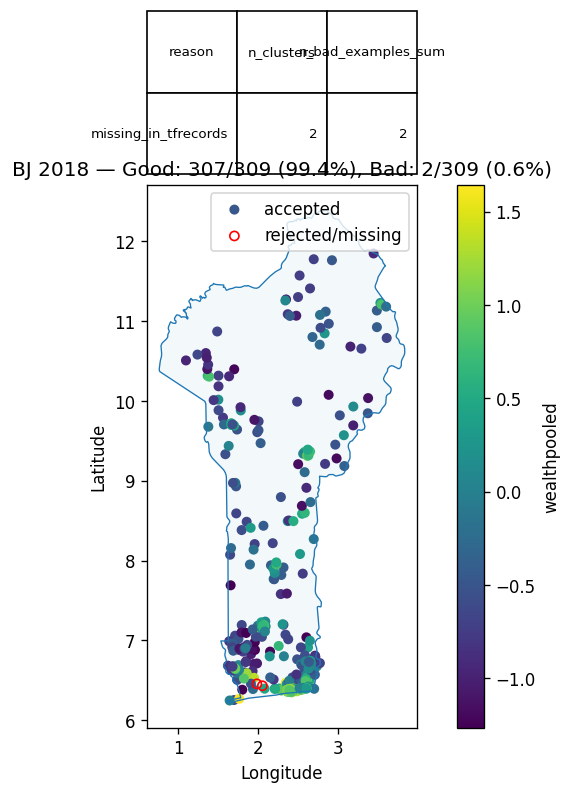

Plotting maps:  12%|███████▉                                                            | 5/43 [00:01<00:09,  4.07it/s]

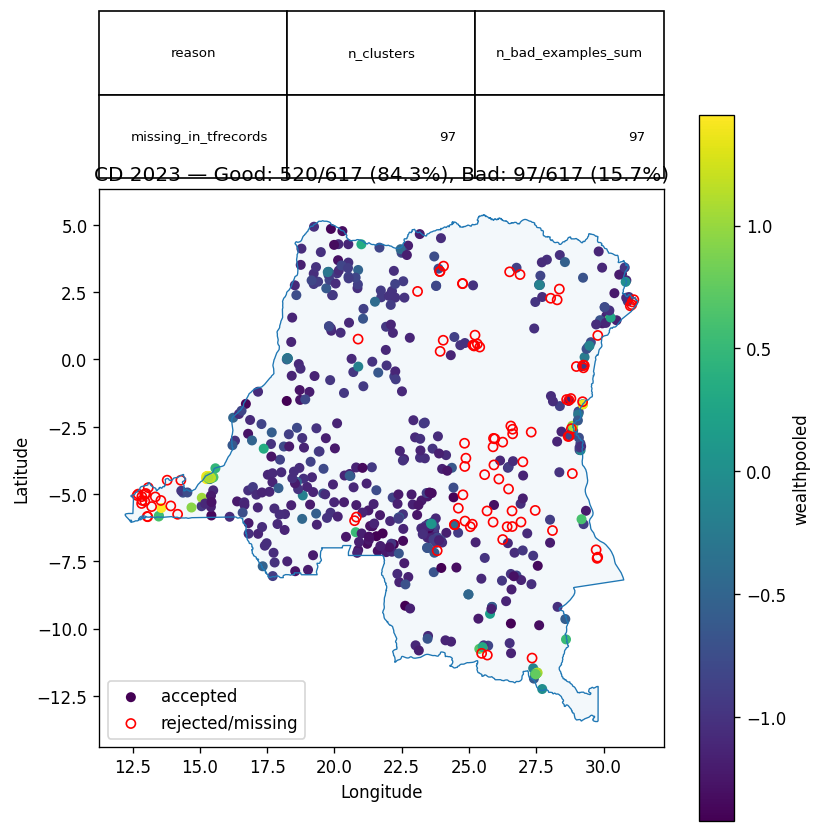

Plotting maps:  14%|█████████▍                                                          | 6/43 [00:01<00:09,  3.79it/s]

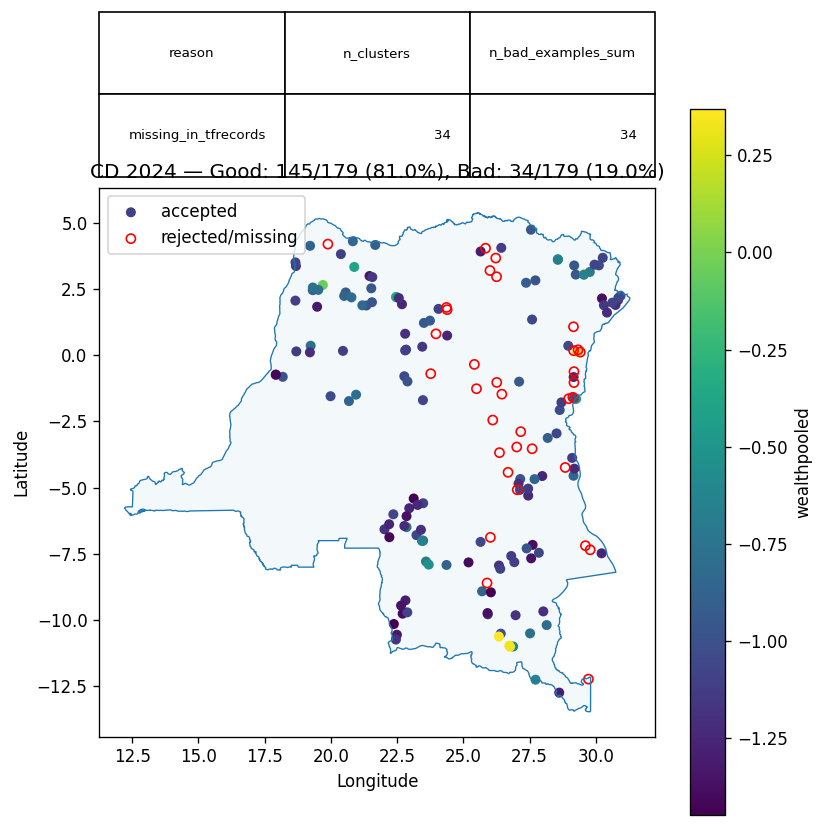

Plotting maps:  16%|███████████                                                         | 7/43 [00:01<00:09,  3.75it/s]

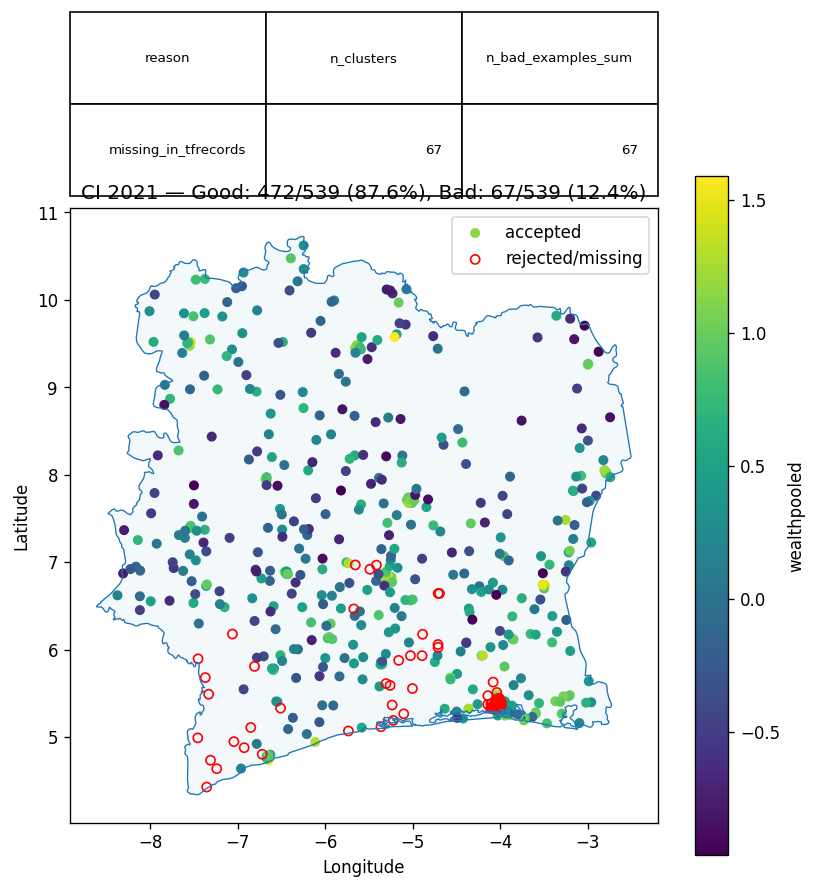

Plotting maps:  19%|████████████▋                                                       | 8/43 [00:02<00:09,  3.67it/s]

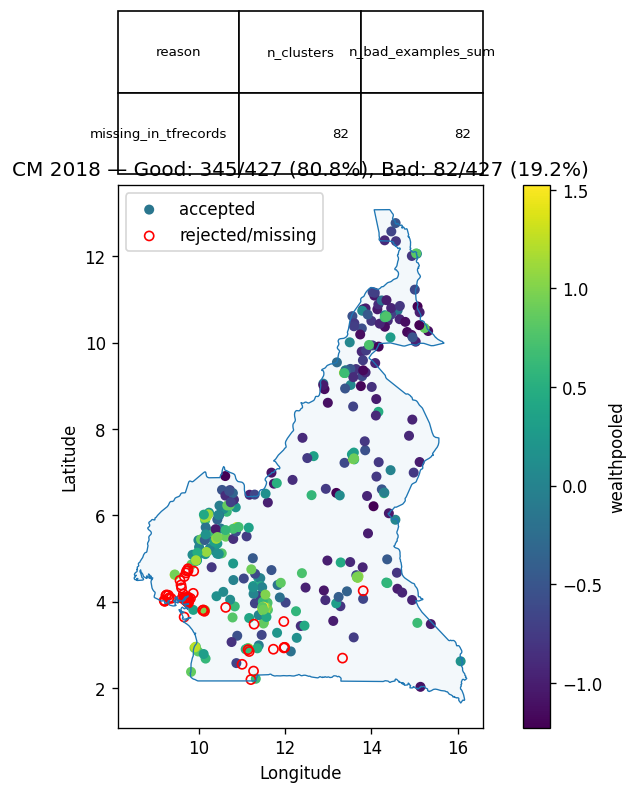

Plotting maps:  21%|██████████████▏                                                     | 9/43 [00:02<00:08,  3.93it/s]

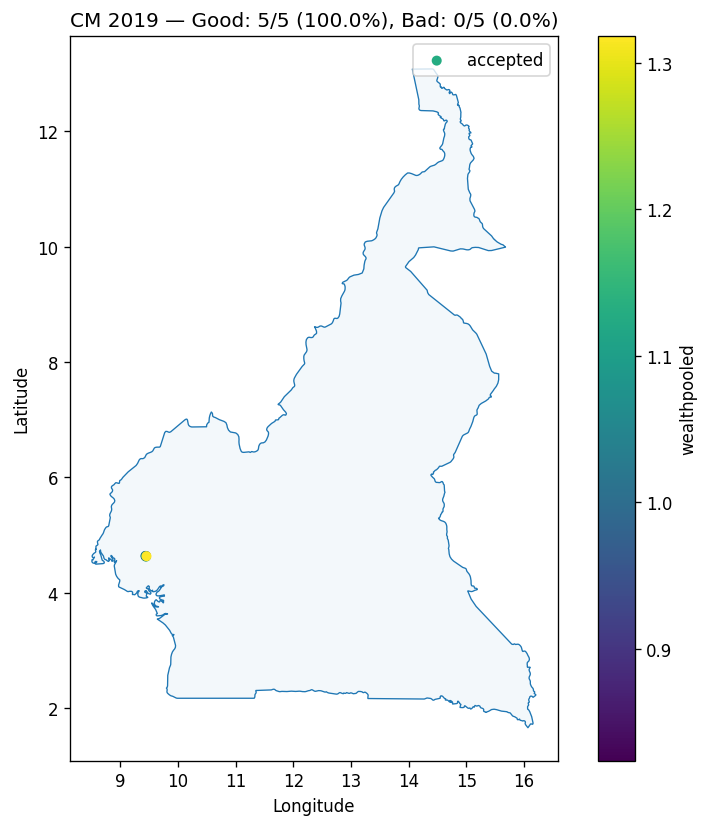

Plotting maps:  23%|███████████████▌                                                   | 10/43 [00:02<00:07,  4.27it/s]

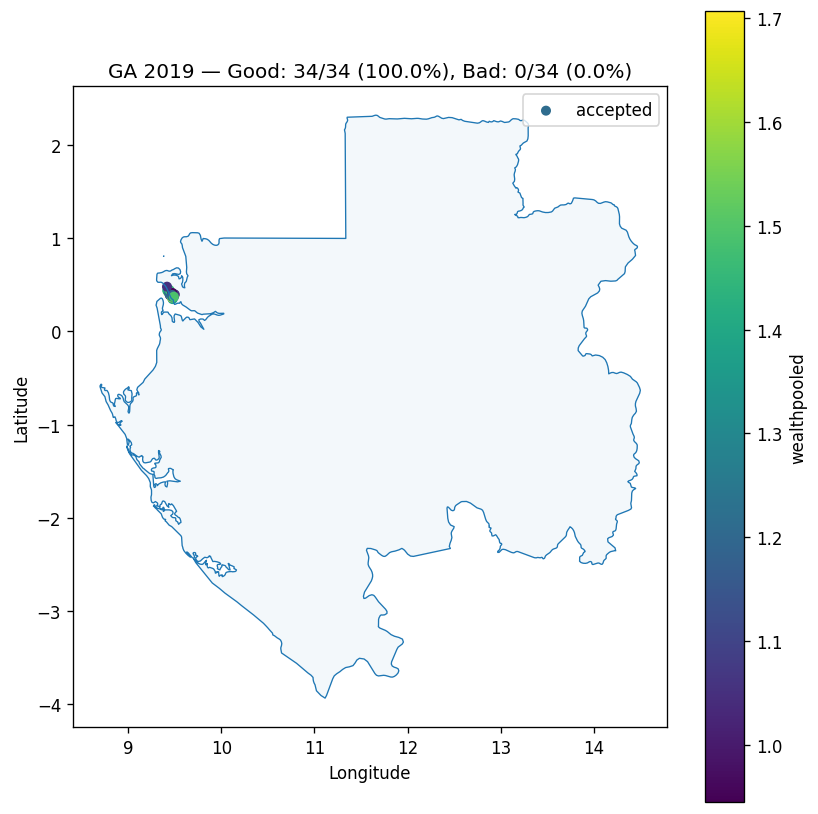

Plotting maps:  26%|█████████████████▏                                                 | 11/43 [00:02<00:07,  4.29it/s]

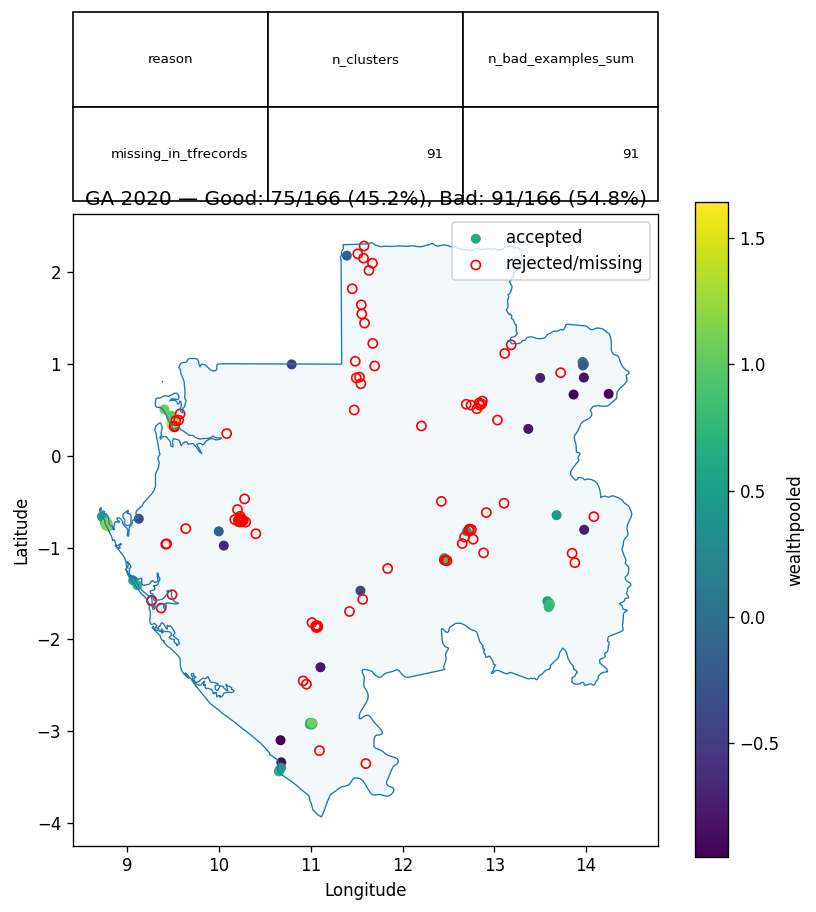

Plotting maps:  28%|██████████████████▋                                                | 12/43 [00:02<00:07,  4.21it/s]

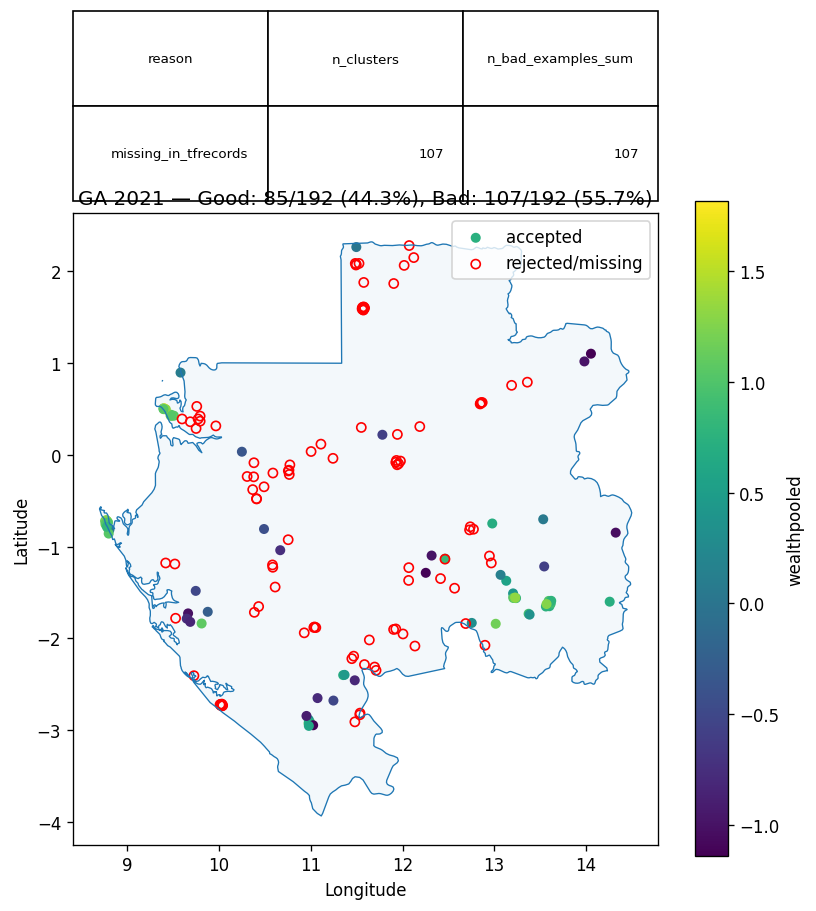

Plotting maps:  30%|████████████████████▎                                              | 13/43 [00:03<00:07,  4.02it/s]

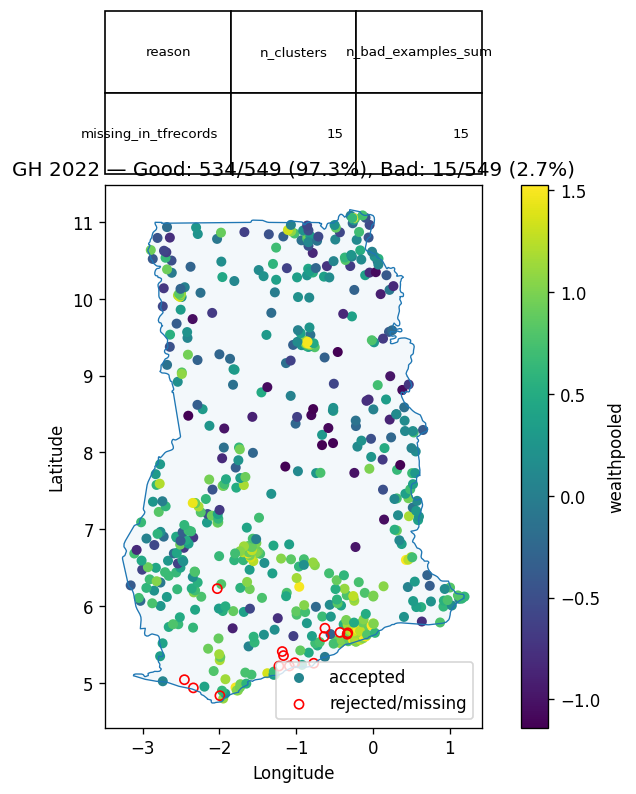

Plotting maps:  33%|█████████████████████▊                                             | 14/43 [00:03<00:07,  4.01it/s]

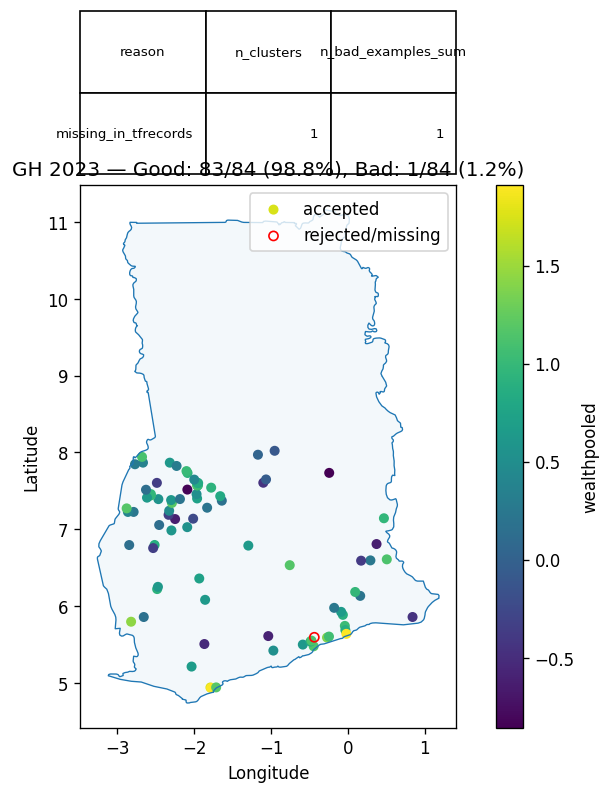

Plotting maps:  35%|███████████████████████▎                                           | 15/43 [00:03<00:07,  3.99it/s]

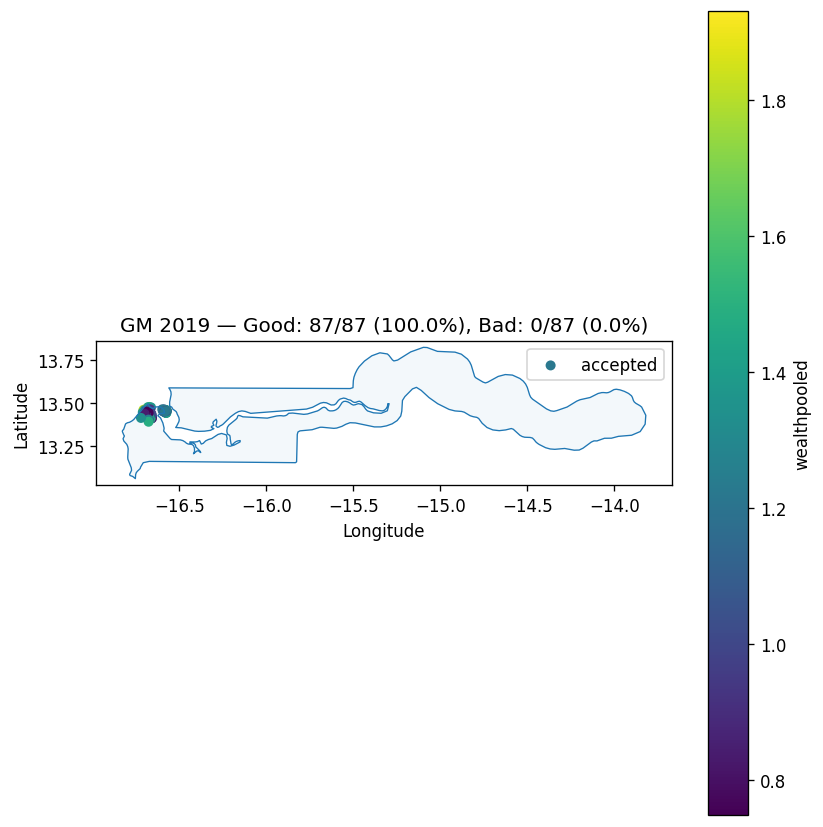

Plotting maps:  37%|████████████████████████▉                                          | 16/43 [00:03<00:06,  4.44it/s]

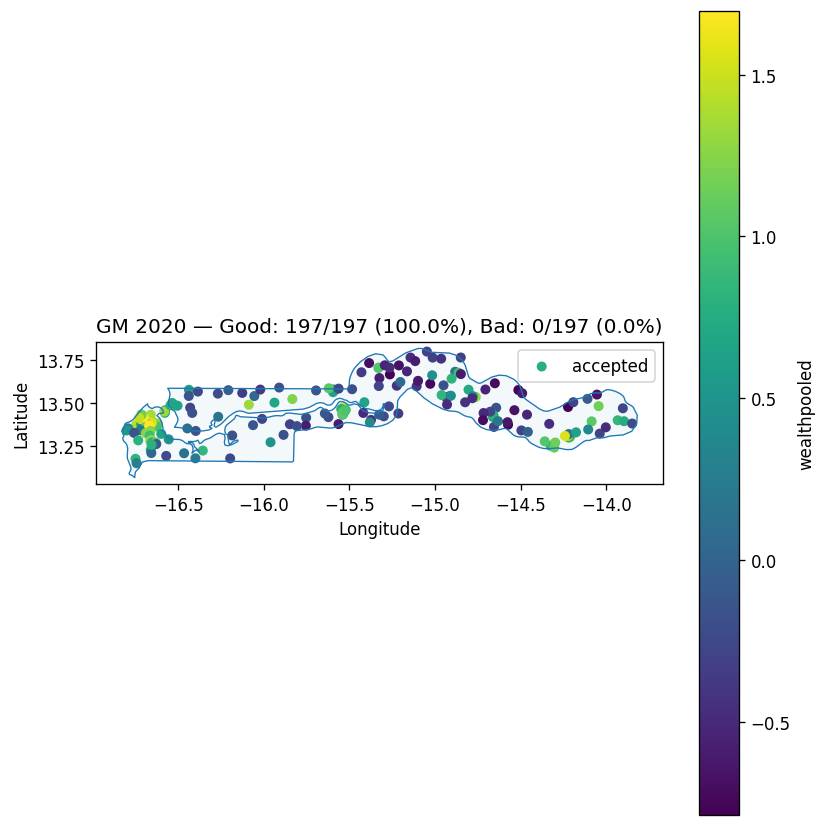

Plotting maps:  40%|██████████████████████████▍                                        | 17/43 [00:04<00:05,  4.48it/s]

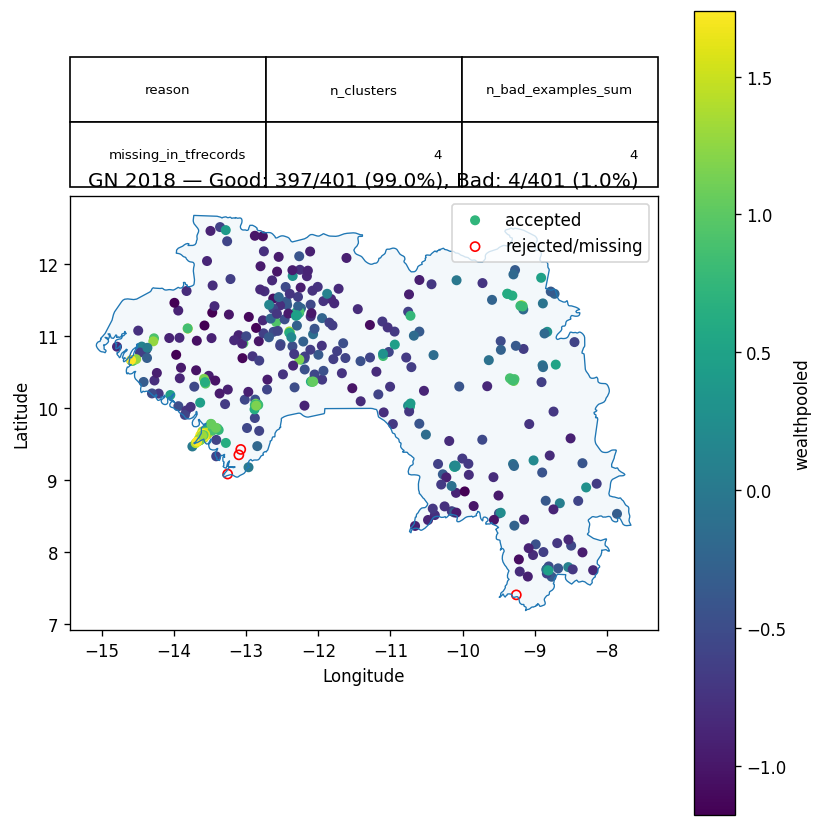

Plotting maps:  42%|████████████████████████████                                       | 18/43 [00:04<00:06,  4.12it/s]

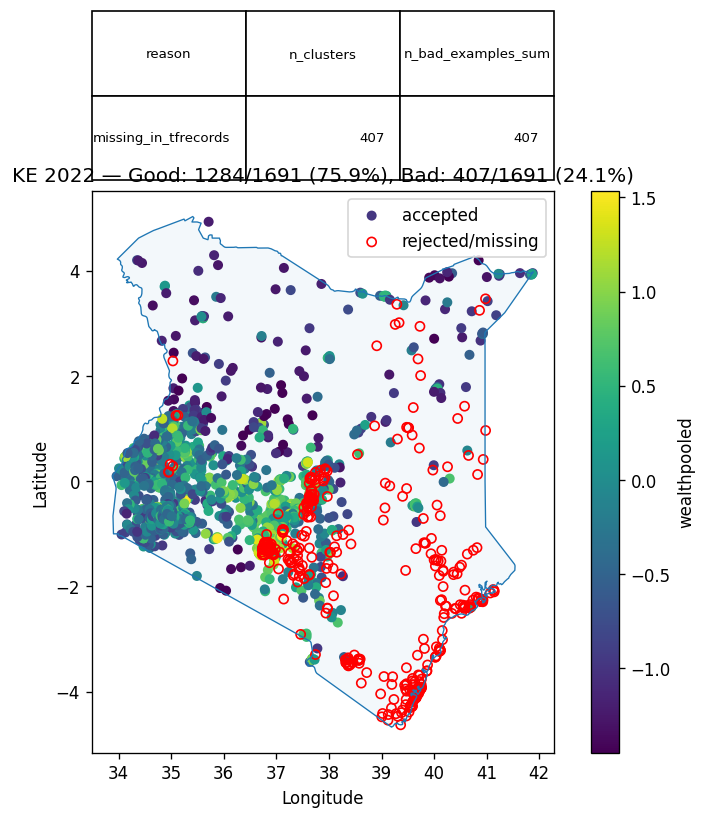

Plotting maps:  44%|█████████████████████████████▌                                     | 19/43 [00:04<00:06,  3.92it/s]

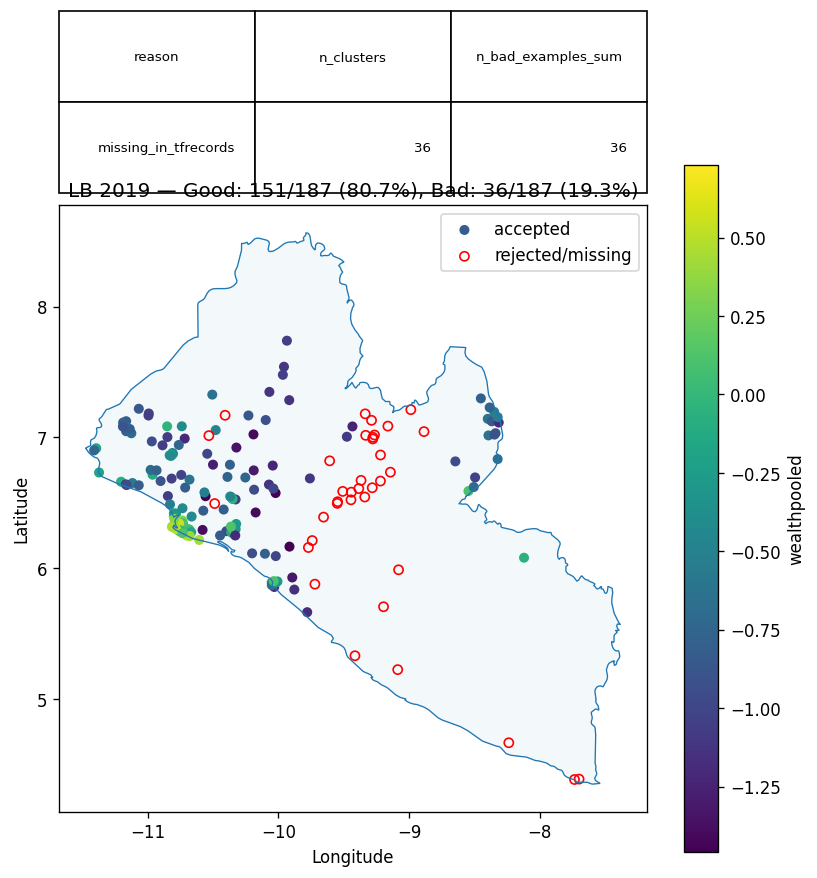

Plotting maps:  47%|███████████████████████████████▏                                   | 20/43 [00:04<00:05,  3.95it/s]

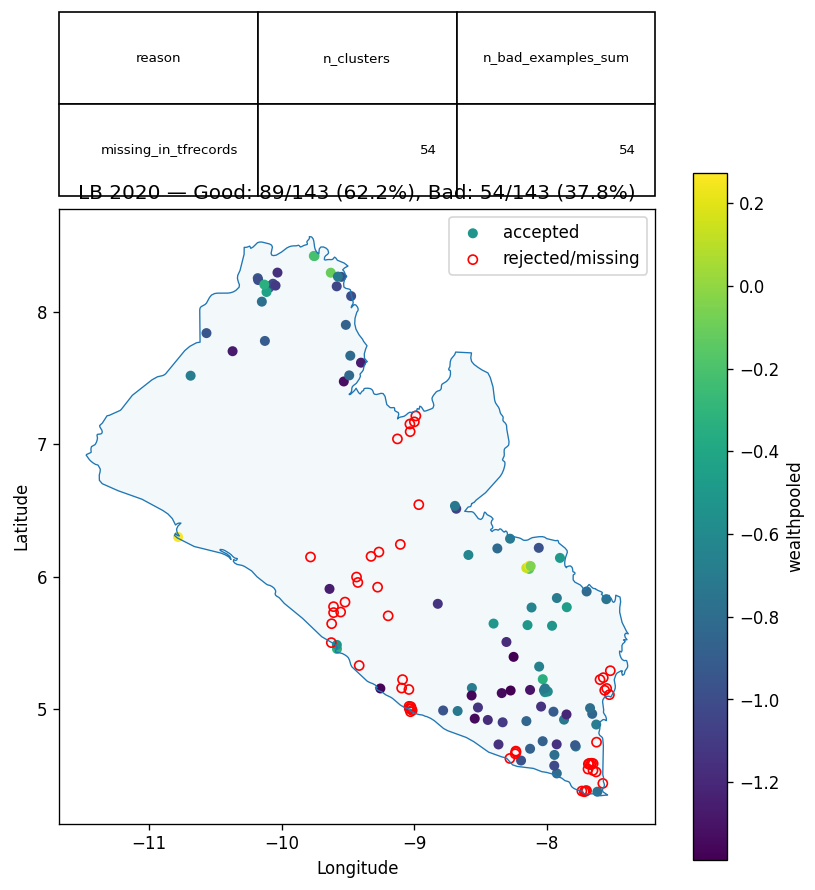

Plotting maps:  49%|████████████████████████████████▋                                  | 21/43 [00:05<00:05,  4.31it/s]

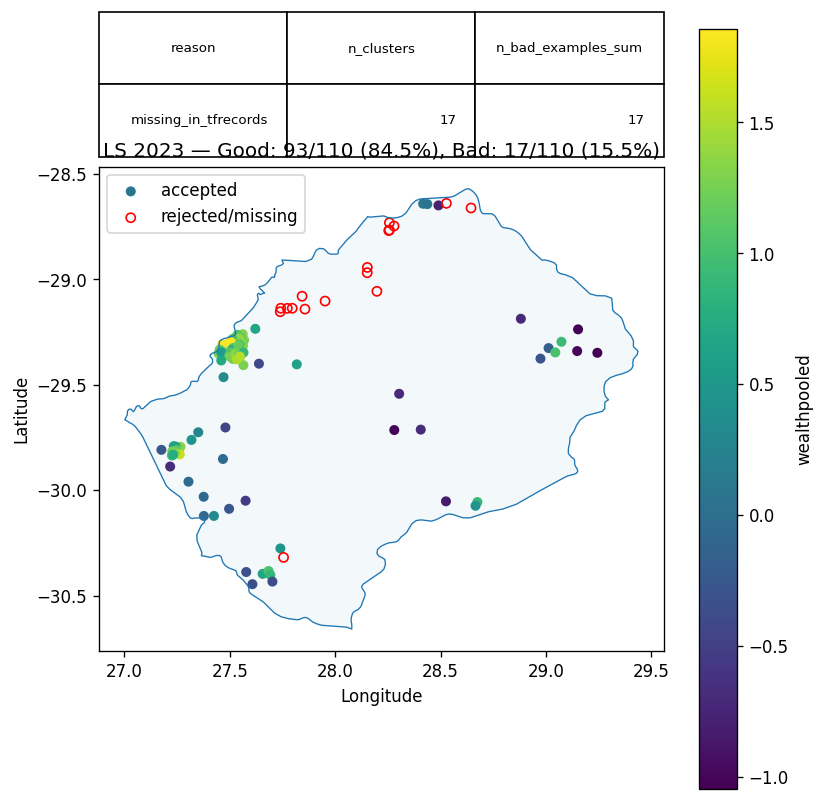

Plotting maps:  51%|██████████████████████████████████▎                                | 22/43 [00:05<00:04,  4.54it/s]

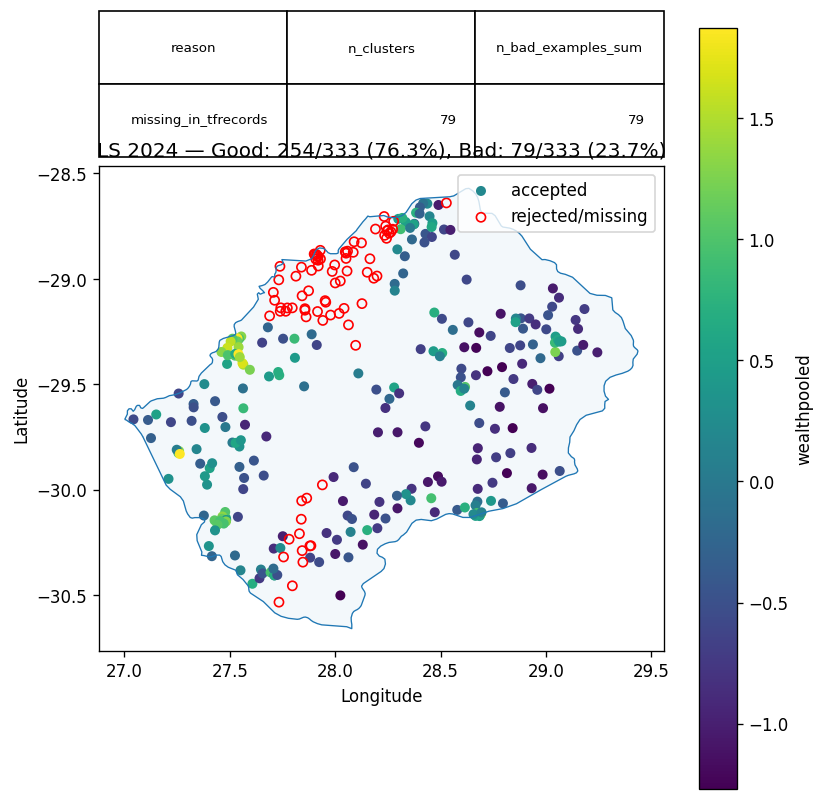

Plotting maps:  53%|███████████████████████████████████▊                               | 23/43 [00:05<00:04,  4.57it/s]

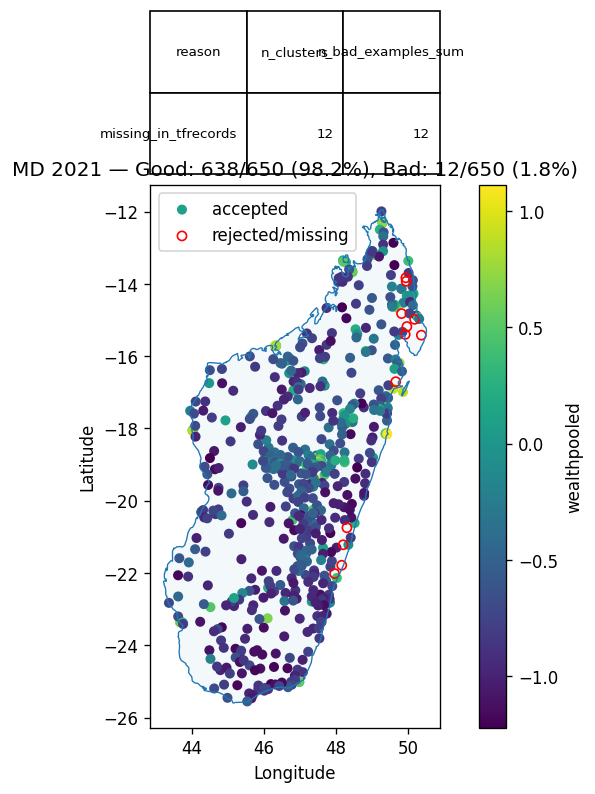

Plotting maps:  56%|█████████████████████████████████████▍                             | 24/43 [00:05<00:04,  4.69it/s]

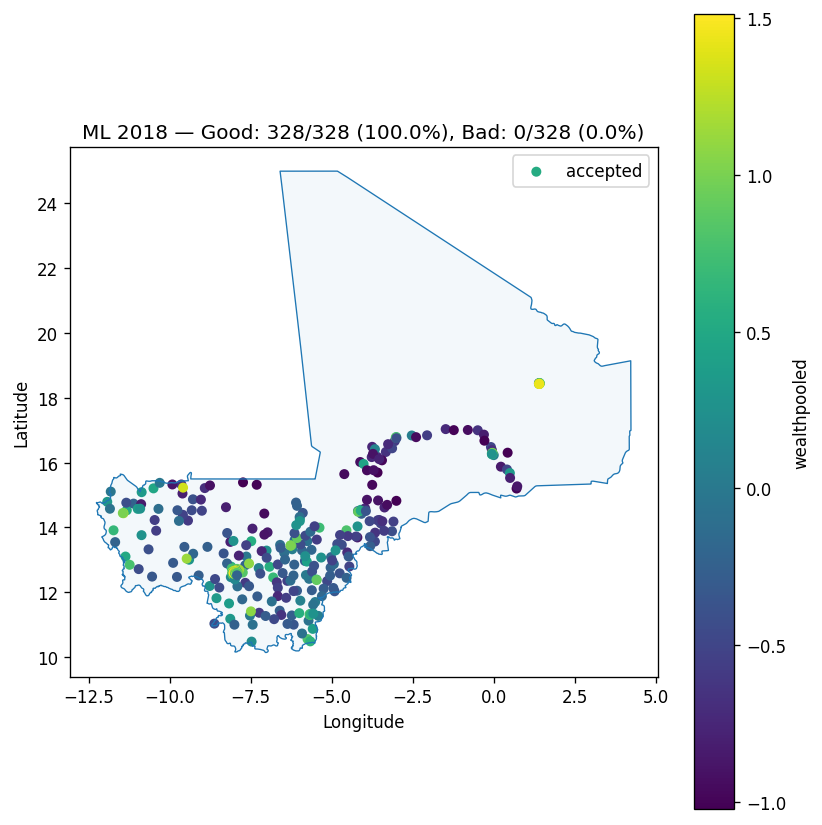

Plotting maps:  58%|██████████████████████████████████████▉                            | 25/43 [00:05<00:03,  4.76it/s]

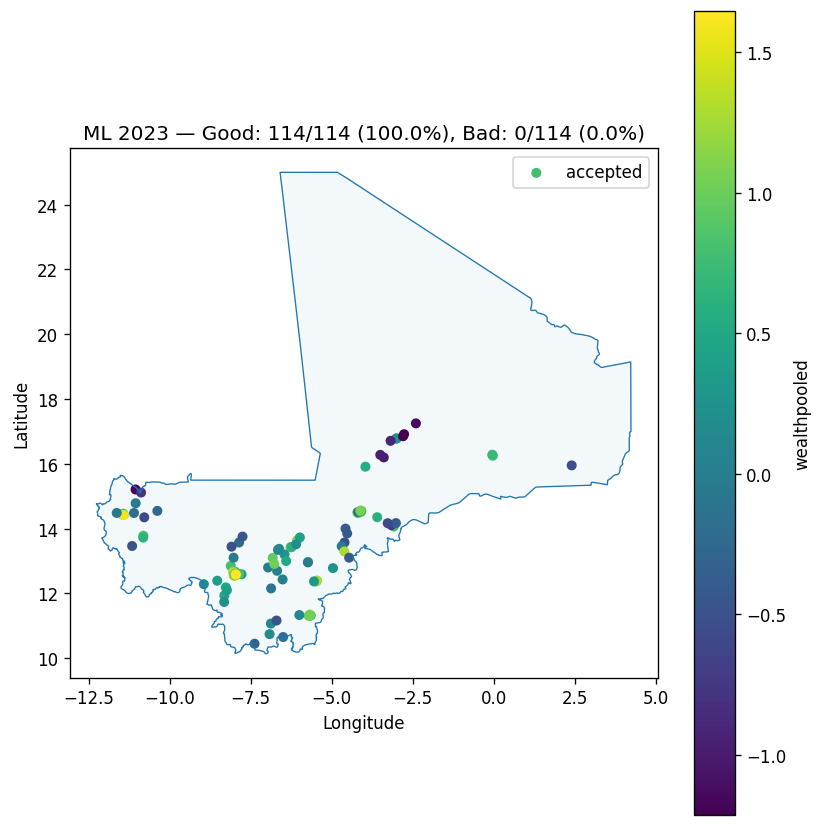

Plotting maps:  60%|████████████████████████████████████████▌                          | 26/43 [00:06<00:03,  4.89it/s]

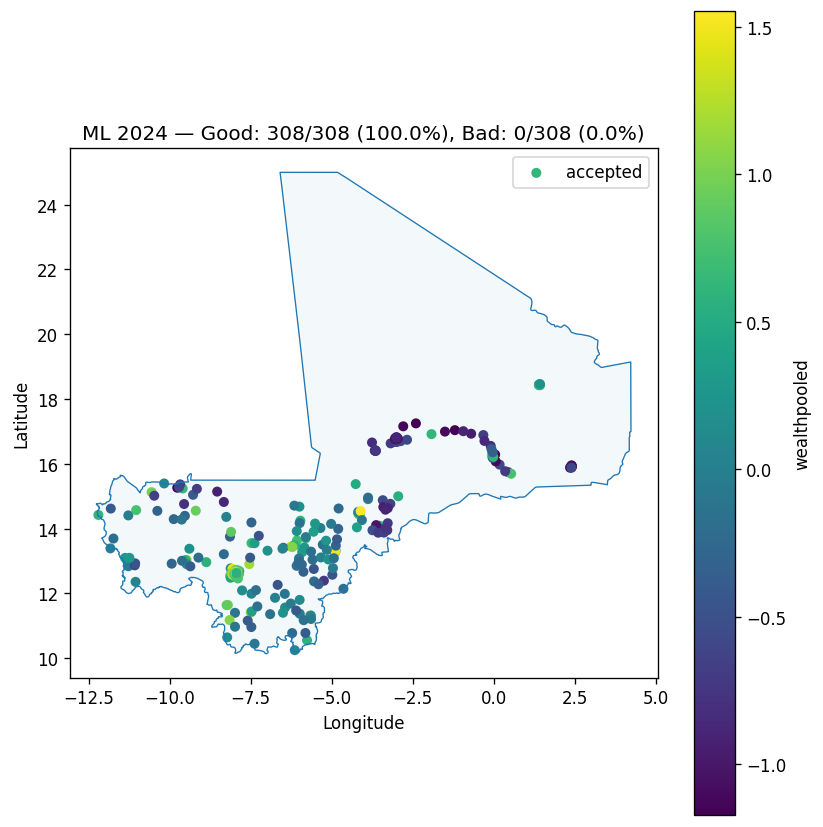

Plotting maps:  63%|██████████████████████████████████████████                         | 27/43 [00:06<00:03,  4.97it/s]

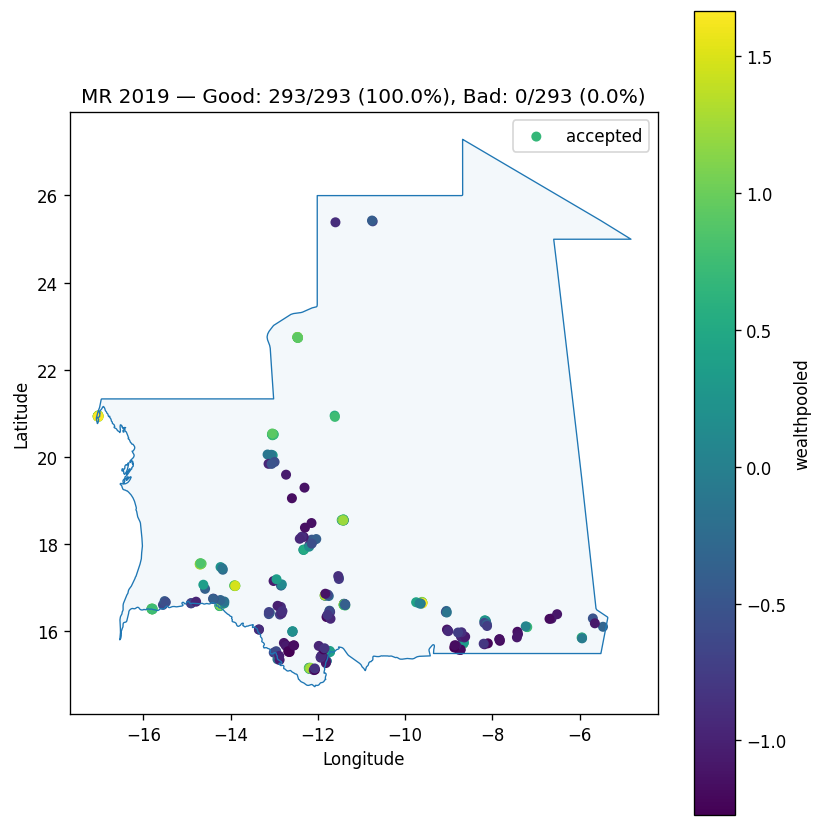

Plotting maps:  65%|███████████████████████████████████████████▋                       | 28/43 [00:06<00:03,  4.75it/s]

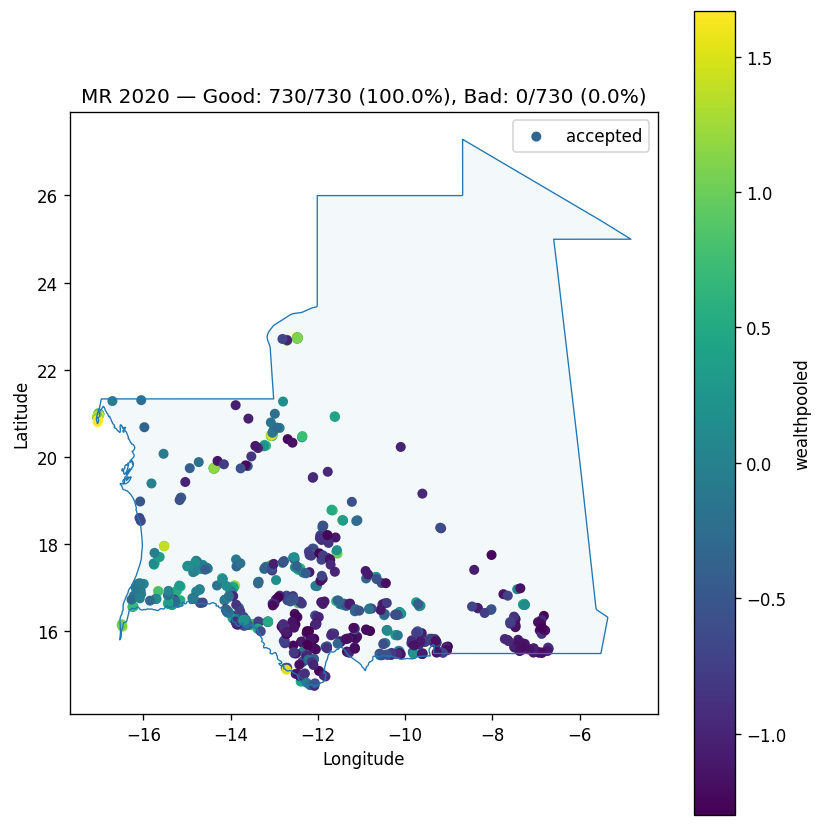

Plotting maps:  67%|█████████████████████████████████████████████▏                     | 29/43 [00:06<00:03,  4.46it/s]

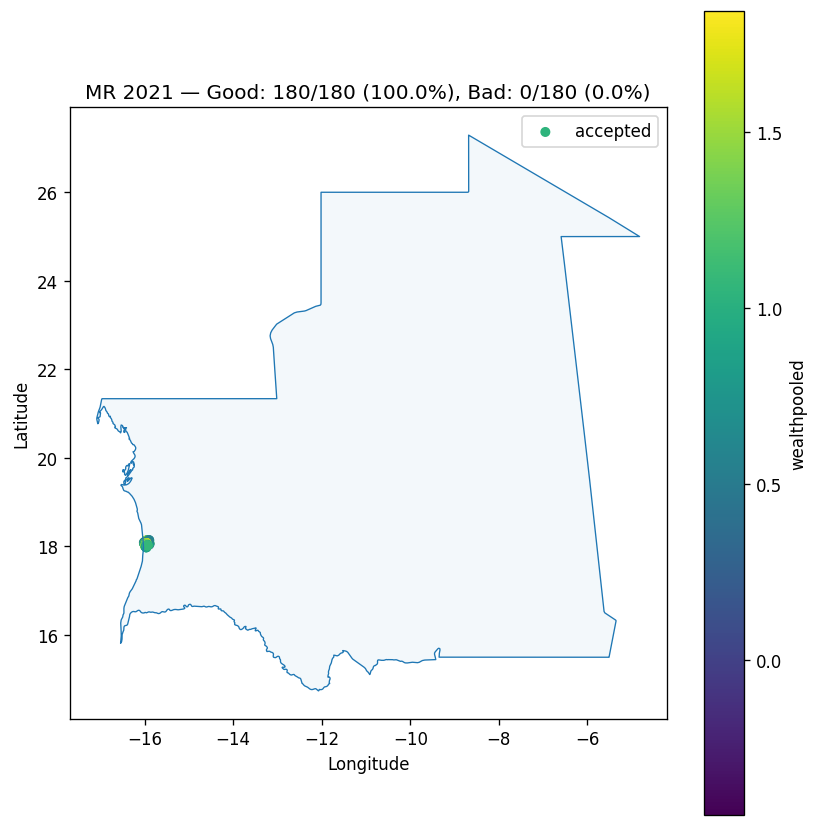

Plotting maps:  70%|██████████████████████████████████████████████▋                    | 30/43 [00:07<00:02,  4.41it/s]

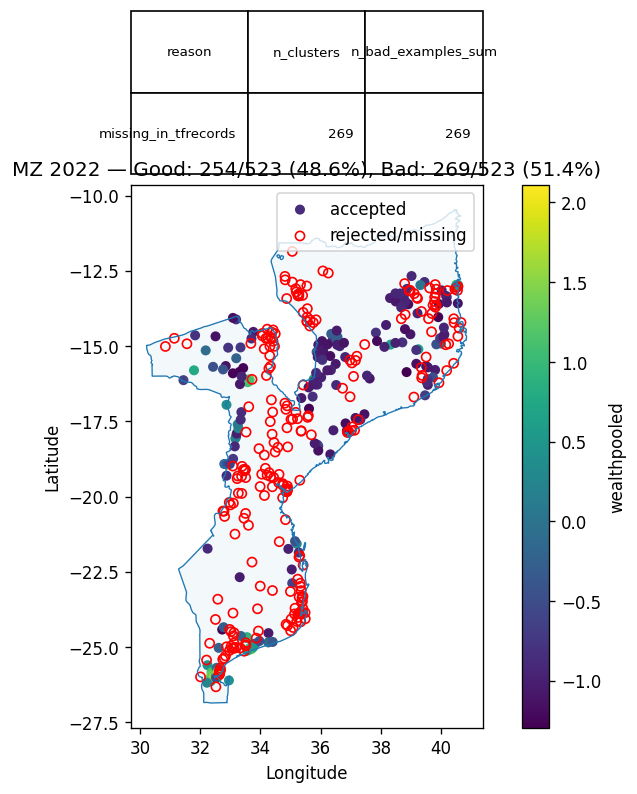

Plotting maps:  72%|████████████████████████████████████████████████▎                  | 31/43 [00:07<00:02,  4.12it/s]

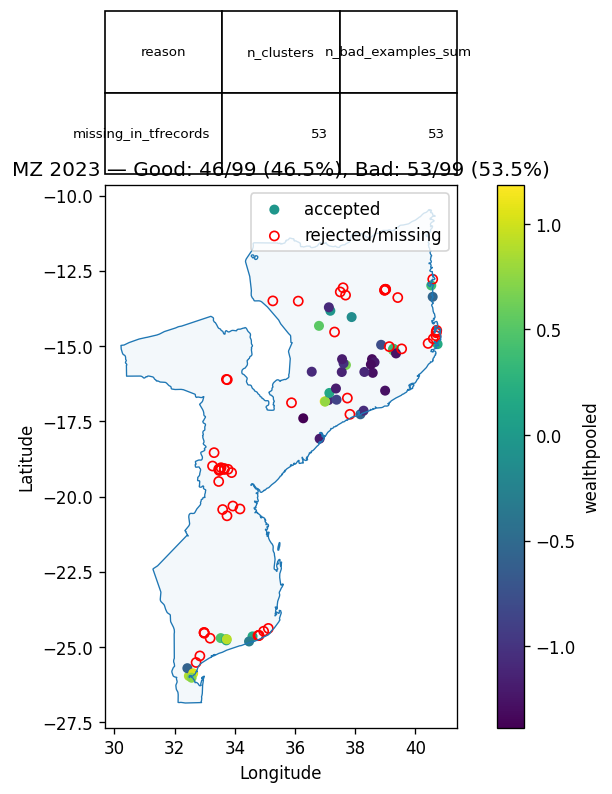

Plotting maps:  74%|█████████████████████████████████████████████████▊                 | 32/43 [00:07<00:02,  3.96it/s]

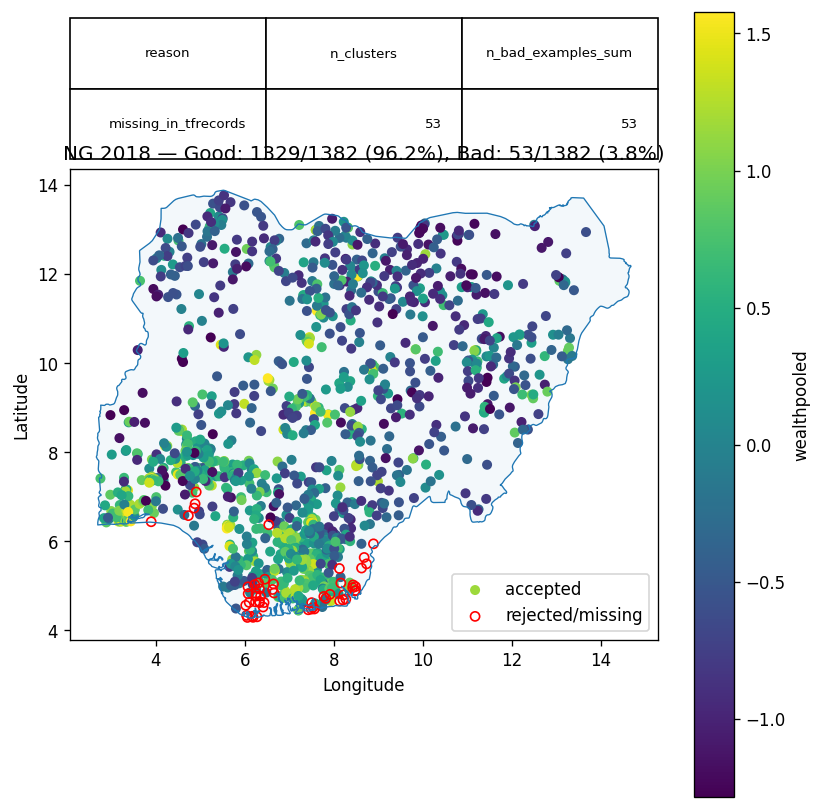

Plotting maps:  77%|███████████████████████████████████████████████████▍               | 33/43 [00:07<00:02,  3.76it/s]

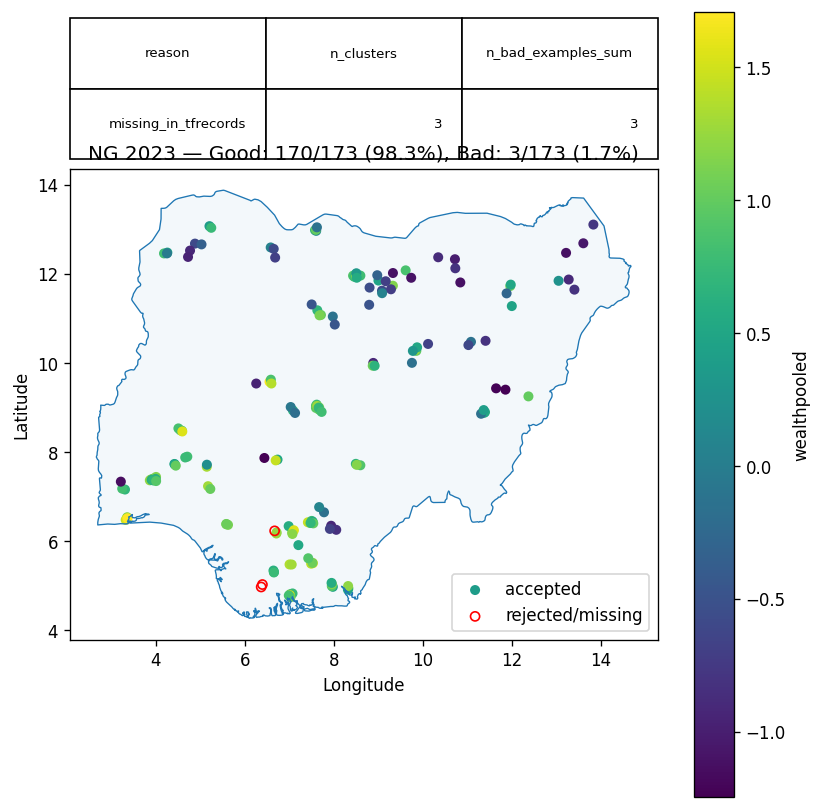

Plotting maps:  79%|████████████████████████████████████████████████████▉              | 34/43 [00:08<00:02,  3.77it/s]

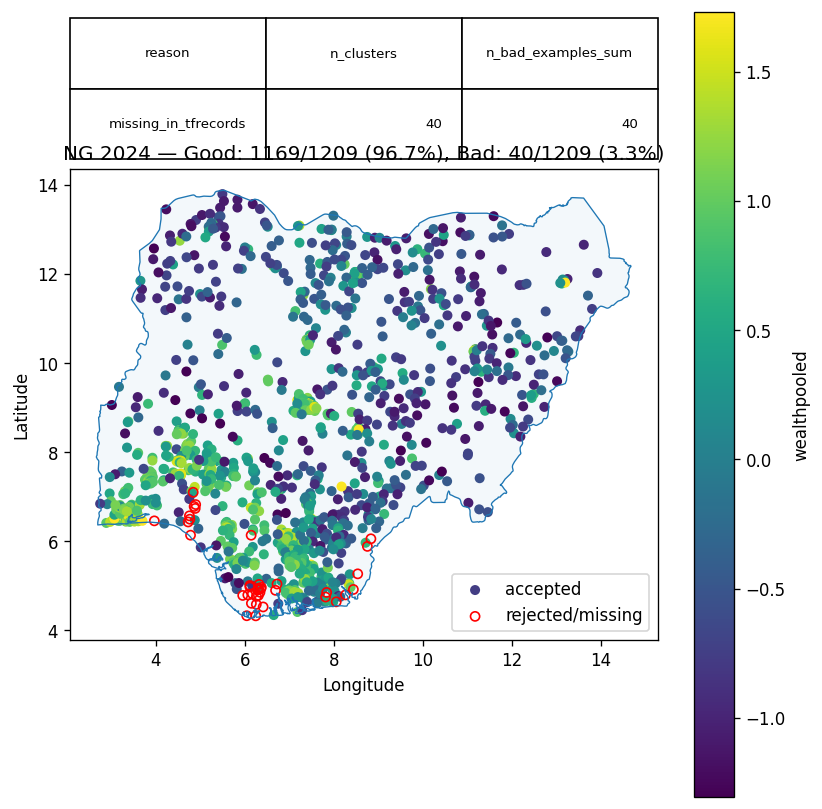

Plotting maps:  81%|██████████████████████████████████████████████████████▌            | 35/43 [00:08<00:02,  3.69it/s]

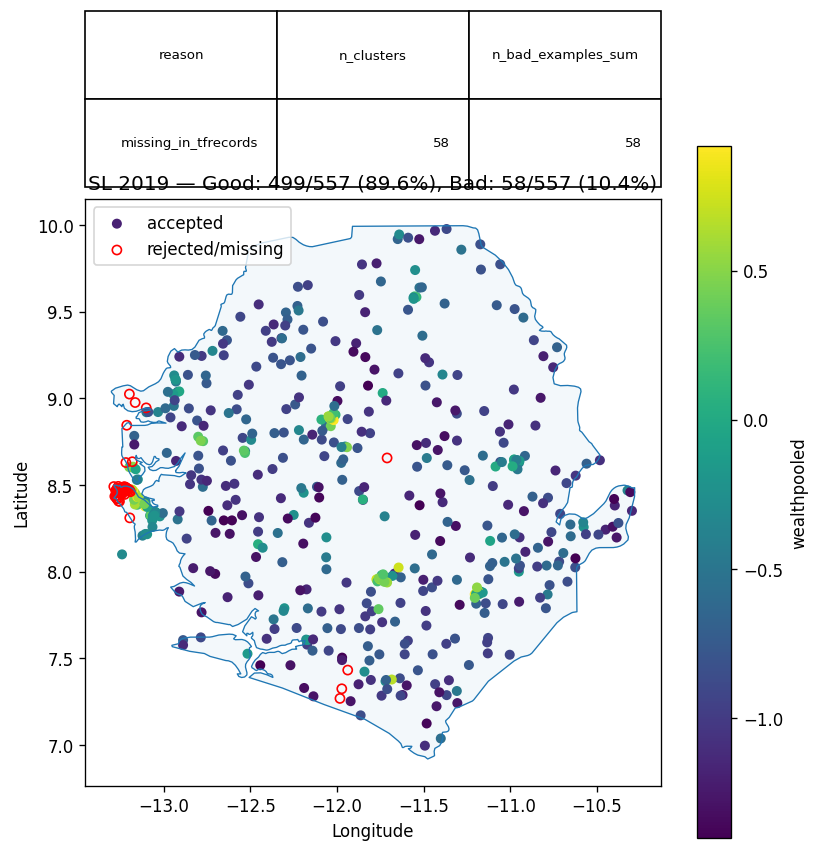

Plotting maps:  84%|████████████████████████████████████████████████████████           | 36/43 [00:08<00:01,  3.65it/s]

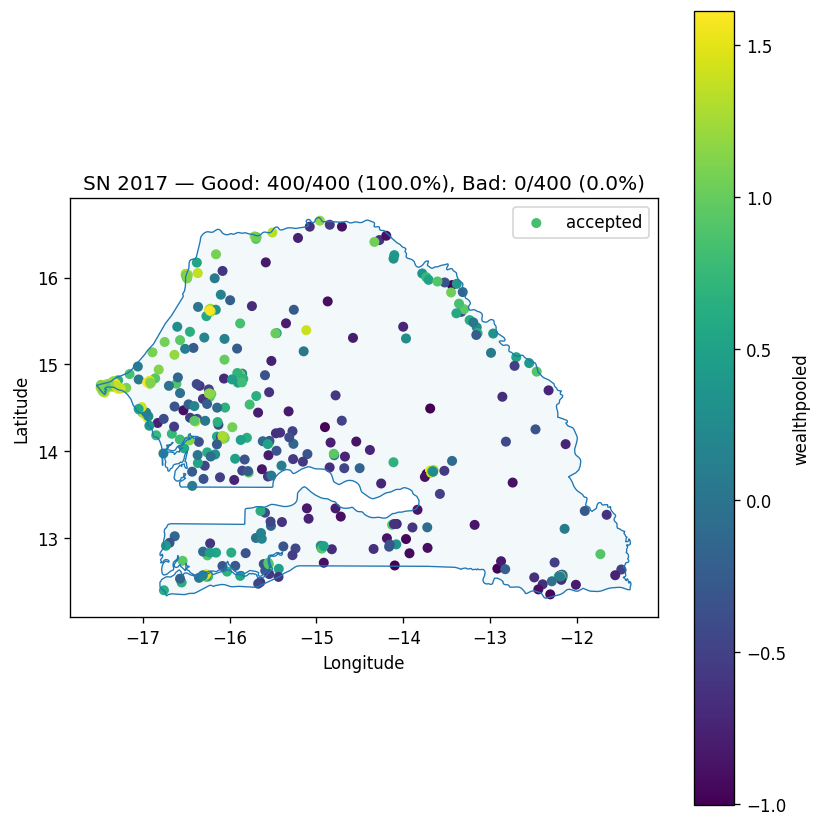

Plotting maps:  86%|█████████████████████████████████████████████████████████▋         | 37/43 [00:08<00:01,  3.76it/s]

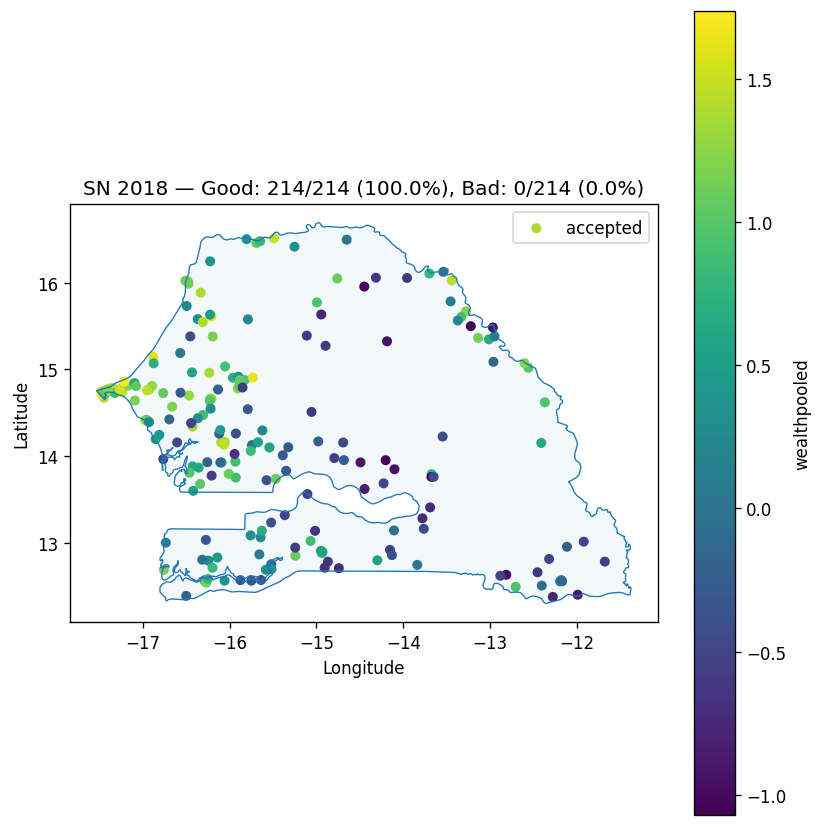

Plotting maps:  88%|███████████████████████████████████████████████████████████▏       | 38/43 [00:09<00:01,  4.20it/s]

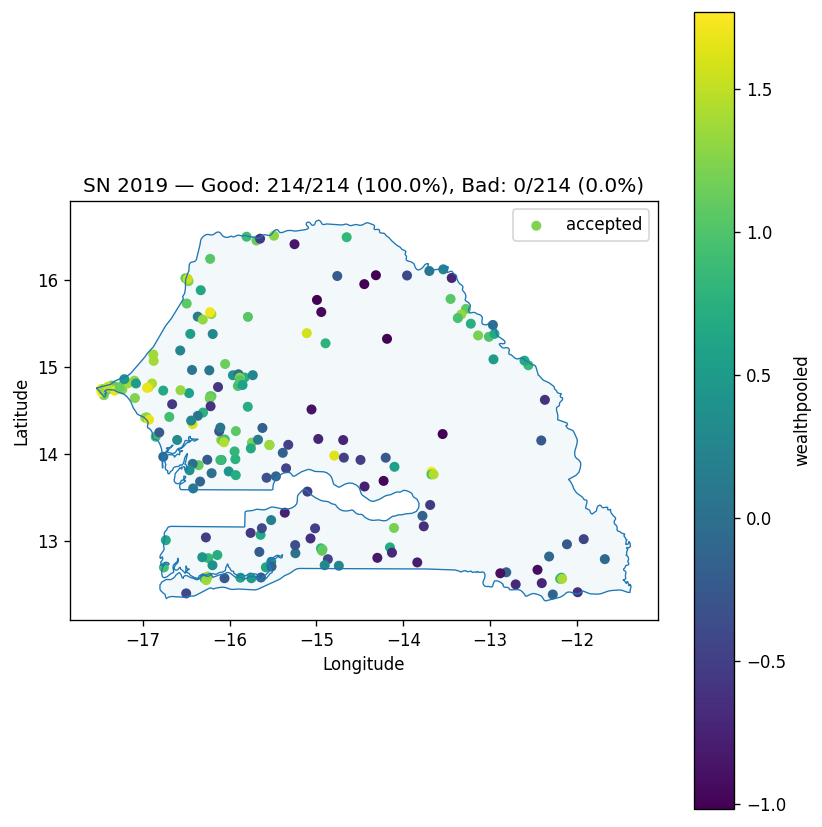

Plotting maps:  91%|████████████████████████████████████████████████████████████▊      | 39/43 [00:09<00:00,  4.44it/s]

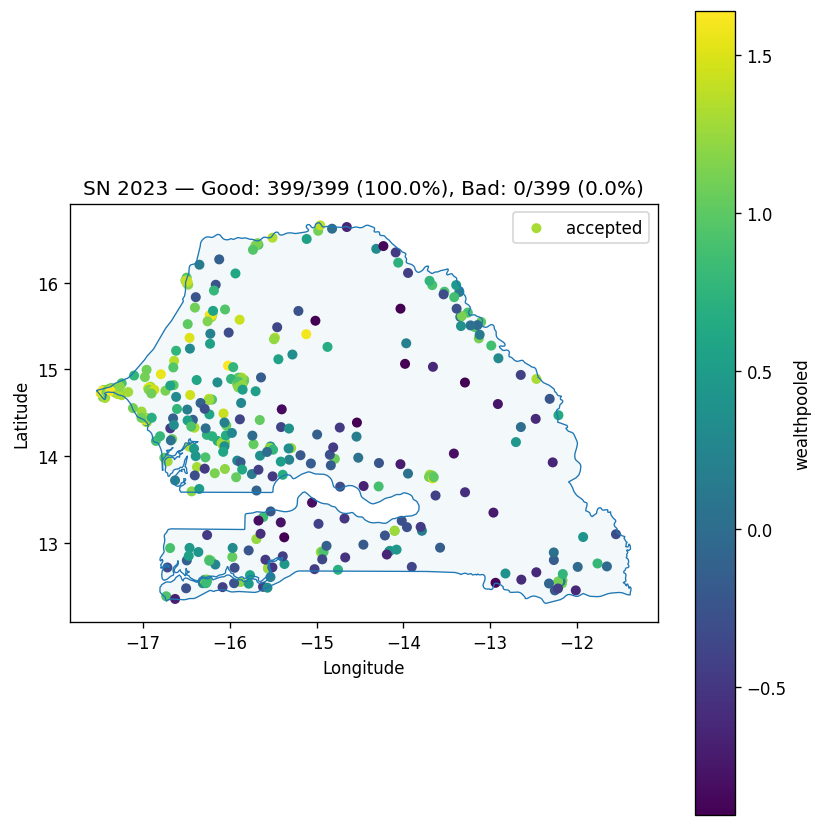

Plotting maps:  93%|██████████████████████████████████████████████████████████████▎    | 40/43 [00:09<00:00,  4.51it/s]

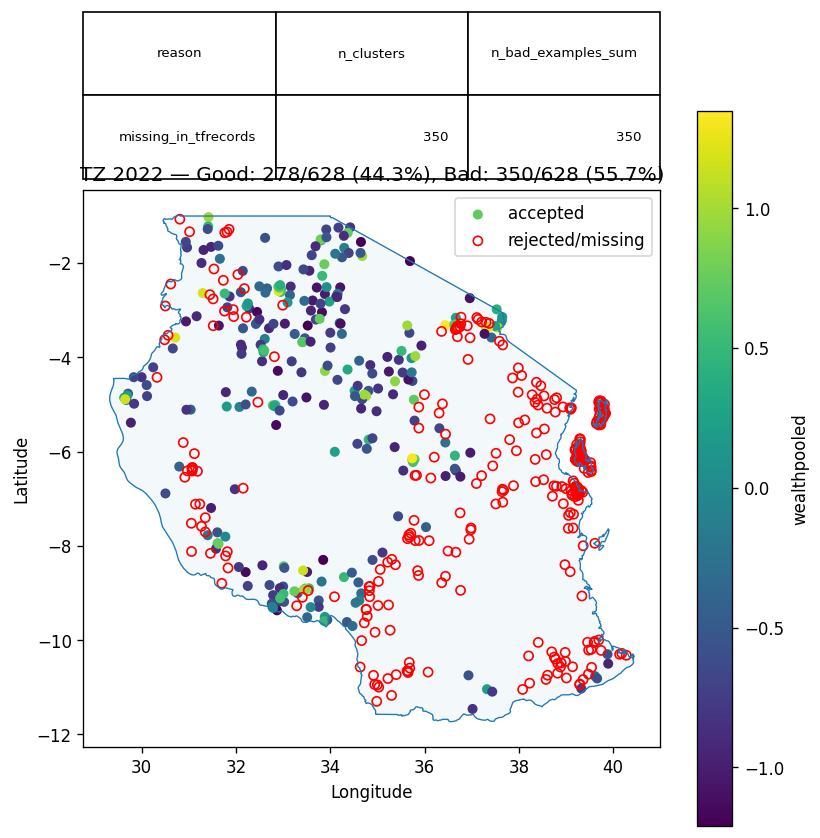

Plotting maps:  95%|███████████████████████████████████████████████████████████████▉   | 41/43 [00:09<00:00,  4.09it/s]

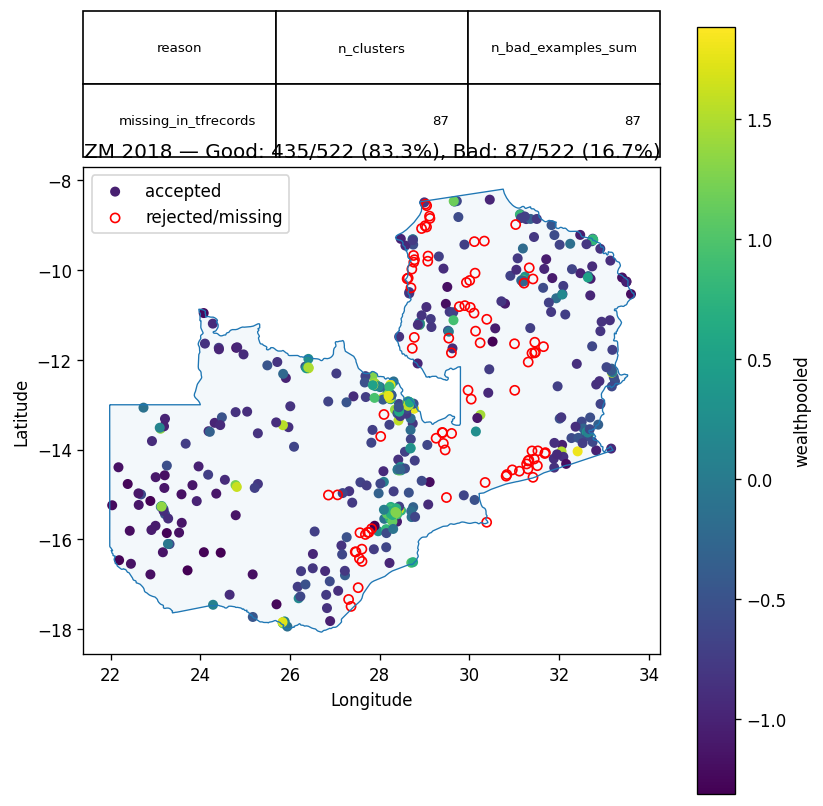

Plotting maps:  98%|█████████████████████████████████████████████████████████████████▍ | 42/43 [00:10<00:00,  3.93it/s]

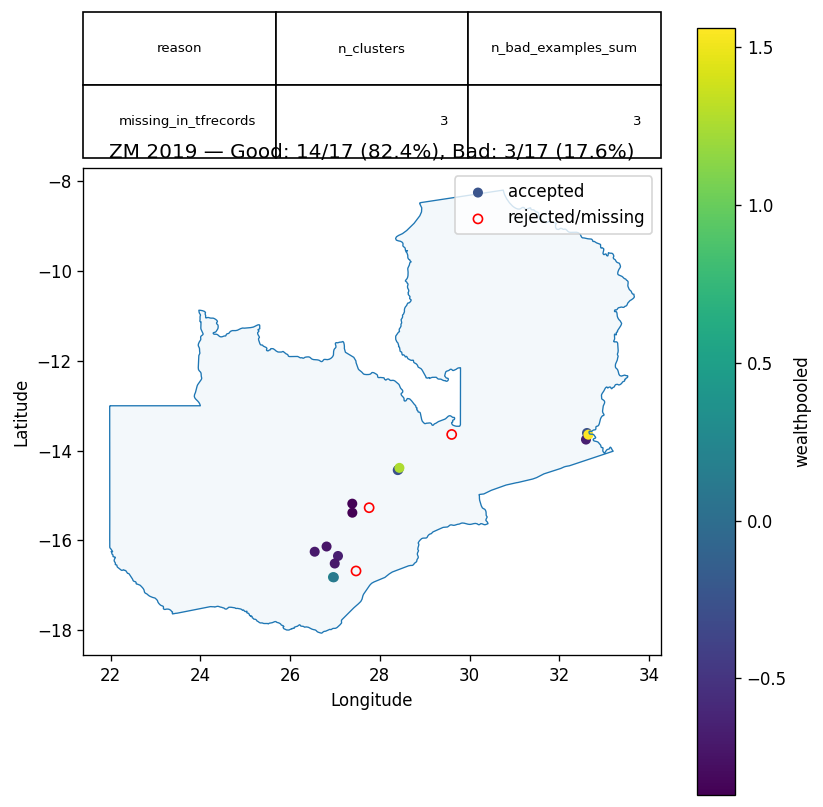

Plotting maps: 100%|███████████████████████████████████████████████████████████████████| 43/43 [00:10<00:00,  4.13it/s]


In [ ]:
# ================================================
# CELL 11 — Plot country-year accepted/rejected maps
# ================================================

from pandas.errors import EmptyDataError

MAX_MAPS = None  # Set to int for quick test

if not MAKE_MAPS:
    print("MAKE_MAPS=False; skipping.")
else:
    # Load clusters CSV for plotting
    cl_all = pd.read_csv(CLUSTERS_CSV, float_precision="high")
    cl_all["country"] = cl_all["country"].astype(str).str.upper().str[:2]
    cl_all["year"] = pd.to_numeric(cl_all["year"], errors="coerce").astype("Int64")

    if "cluster_index" not in cl_all.columns and "cluster" in cl_all.columns:
        cl_all = cl_all.rename(columns={"cluster": "cluster_index"})

    cl_all["cluster_index"] = pd.to_numeric(cl_all["cluster_index"], errors="coerce").astype("Int64")
    cl_all["lat"] = pd.to_numeric(cl_all["lat"], errors="coerce")
    cl_all["lon"] = pd.to_numeric(cl_all["lon"], errors="coerce")
    cl_all["wealthpooled"] = pd.to_numeric(cl_all["wealthpooled"], errors="coerce")
    cl_all = cl_all.dropna(subset=["country", "year", "cluster_index", "lat", "lon", "wealthpooled"]).copy()
    cl_all["year"] = cl_all["year"].astype(int)
    cl_all["cluster_index"] = cl_all["cluster_index"].astype(int)

    def read_cluster_list(path):
        if not path.exists():
            return set()
        try:
            df = pd.read_csv(path)
            if "cluster_index" not in df.columns:
                return set()
            return set(pd.to_numeric(df["cluster_index"], errors="coerce").dropna().astype(int).tolist())
        except:
            return set()

    def read_bad_reasons(path):
        cols = ["reason", "n_clusters", "n_bad_examples_sum"]
        if not path.exists():
            return pd.DataFrame(columns=cols)
        try:
            df = pd.read_csv(path)
            if "reason" not in df.columns or "cluster_index" not in df.columns:
                return pd.DataFrame(columns=cols)
            df["n_bad_examples"] = df.get("n_bad_examples", 1)
            agg = df.groupby("reason", as_index=False).agg(
                n_clusters=("cluster_index", "nunique"),
                n_bad_examples_sum=("n_bad_examples", "sum")
            ).sort_values("n_clusters", ascending=False)
            return agg
        except:
            return pd.DataFrame(columns=cols)

    # Natural Earth setup
    ISO_OVERRIDES = {"LB": "LR", "MD": "MG"}
    NE10_DIR = NE_CACHE_DIR / "ne10"
    NE10_ZIP = NE_CACHE_DIR / "ne10.zip"
    NE10_URL = "https://github.com/nvkelso/natural-earth-vector/archive/refs/heads/master.zip"

    def ensure_ne10():
        if NE10_DIR.exists():
            return
        print("Downloading Natural Earth 10m data...")
        r = requests.get(NE10_URL, timeout=120)
        r.raise_for_status()
        NE10_ZIP.write_bytes(r.content)
        with zipfile.ZipFile(NE10_ZIP, "r") as z:
            z.extractall(NE10_DIR)

    def load_admin0_10m():
        ensure_ne10()
        for root, _, fs in os.walk(NE10_DIR):
            if "ne_10m_admin_0_countries.shp" in fs:
                return gpd.read_file(os.path.join(root, "ne_10m_admin_0_countries.shp"))
        raise FileNotFoundError("ne_10m_admin_0_countries.shp not found")

    try:
        WORLD10 = load_admin0_10m()
        ISO_A2_COL = next((c for c in WORLD10.columns if str(c).upper().startswith("ISO_A2")), None)
    except:
        WORLD10, ISO_A2_COL = None, None

    def get_country_geom(cc):
        if WORLD10 is None or ISO_A2_COL is None:
            return None
        cc2 = ISO_OVERRIDES.get(cc, cc)
        sub = WORLD10.loc[WORLD10[ISO_A2_COL].astype(str) == cc2]
        return None if sub.empty else sub

    def plot_country_year_map(country, year, survey_df, good_set, bad_set, bad_reasons_tbl=None):
        dfp = survey_df.copy()
        all_clusters = set(dfp["cluster_index"].astype(int).tolist())
        good = set(map(int, good_set))
        bad = set(map(int, bad_set))
        missing = all_clusters - good - bad
        combined_bad = bad | missing

        n_total = len(all_clusters)
        n_good = len(good & all_clusters)
        n_bad = len(combined_bad & all_clusters)
        pct_good = (100.0 * n_good / n_total) if n_total else 0.0
        pct_bad = (100.0 * n_bad / n_total) if n_total else 0.0

        good_df = dfp[dfp["cluster_index"].isin(good)].copy()
        bad_df = dfp[dfp["cluster_index"].isin(combined_bad)].copy()

        fig, ax = plt.subplots(figsize=(7, 7))

        geom = get_country_geom(country)
        if geom is not None:
            geom.boundary.plot(ax=ax, linewidth=0.8)
            geom.plot(ax=ax, alpha=0.05)

        sc = None
        if len(good_df) > 0:
            vmin = float(good_df["wealthpooled"].quantile(0.01))
            vmax = float(good_df["wealthpooled"].quantile(0.99))
            sc = ax.scatter(good_df["lon"], good_df["lat"], c=good_df["wealthpooled"],
                           s=25, cmap="viridis", vmin=vmin, vmax=vmax, label="accepted")

        if len(bad_df) > 0:
            ax.scatter(bad_df["lon"], bad_df["lat"], s=30, facecolors="none",
                      edgecolors="red", linewidths=1.0, label="rejected/missing")

        if sc is not None:
            fig.colorbar(sc, ax=ax).set_label("wealthpooled")

        title = f"{country} {year} — Good: {n_good}/{n_total} ({pct_good:.1f}%), Bad: {n_bad}/{n_total} ({pct_bad:.1f}%)"
        ax.set_title(title)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        ax.set_aspect("equal", "box")
        ax.legend()

        if bad_reasons_tbl is not None and len(bad_reasons_tbl):
            show = bad_reasons_tbl.head(8)
            tbl = ax.table(
                cellText=show[["reason", "n_clusters", "n_bad_examples_sum"]].values.tolist(),
                colLabels=["reason", "n_clusters", "n_bad_examples_sum"],
                loc="upper center", bbox=[0.0, 1.02, 1.0, 0.30])
            tbl.auto_set_font_size(False)
            tbl.set_fontsize(8)

        plt.tight_layout()
        plt.show()

    # Build plot queue
    to_plot = []
    for cc, yr, _ in round_index:
        sdf = cl_all[(cl_all["country"] == cc) & (cl_all["year"] == yr)].copy()
        if sdf.empty:
            continue

        audit_dir = AUDIT_DIR / f"{cc}_{yr}"
        good_set = read_cluster_list(audit_dir / GOOD_LIST_CSV)
        bad_set = read_cluster_list(audit_dir / BAD_LIST_CSV)
        reasons = read_bad_reasons(audit_dir / BAD_LIST_CSV)

        to_plot.append((cc, yr, sdf, good_set, bad_set, reasons))

    print(f"Plotting maps for {len(to_plot)} country-year combinations")

    n_done = 0
    for (cc, yr, sdf, good_set, bad_set, reasons) in tqdm(to_plot, desc="Plotting maps"):
        plot_country_year_map(cc, yr, sdf, good_set, bad_set, bad_reasons_tbl=reasons)
        n_done += 1
        if MAX_MAPS is not None and n_done >= MAX_MAPS:
            break

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\viirs_center_by_country_year.png


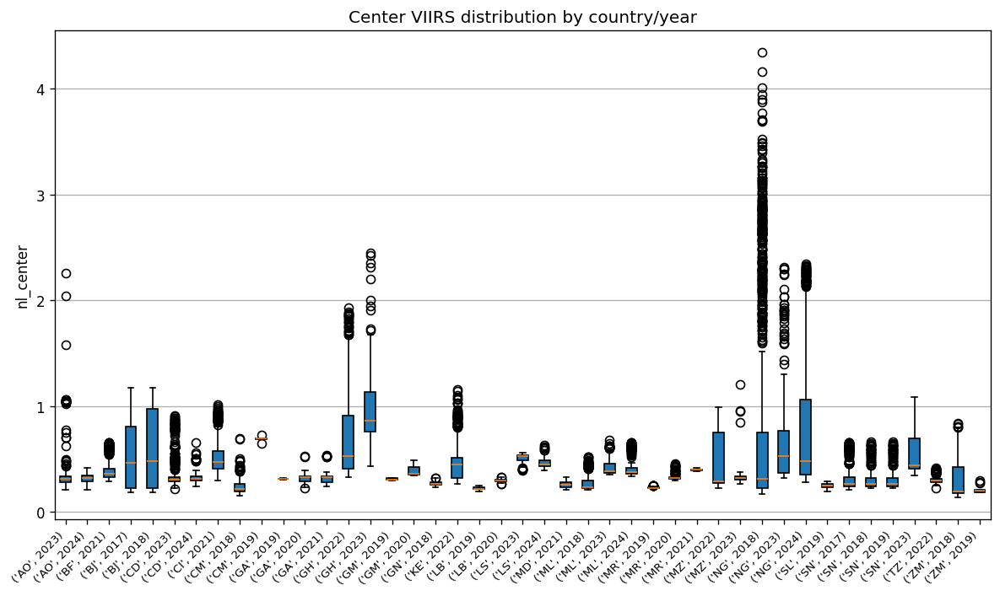

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\viirs_mean_by_country_year.png


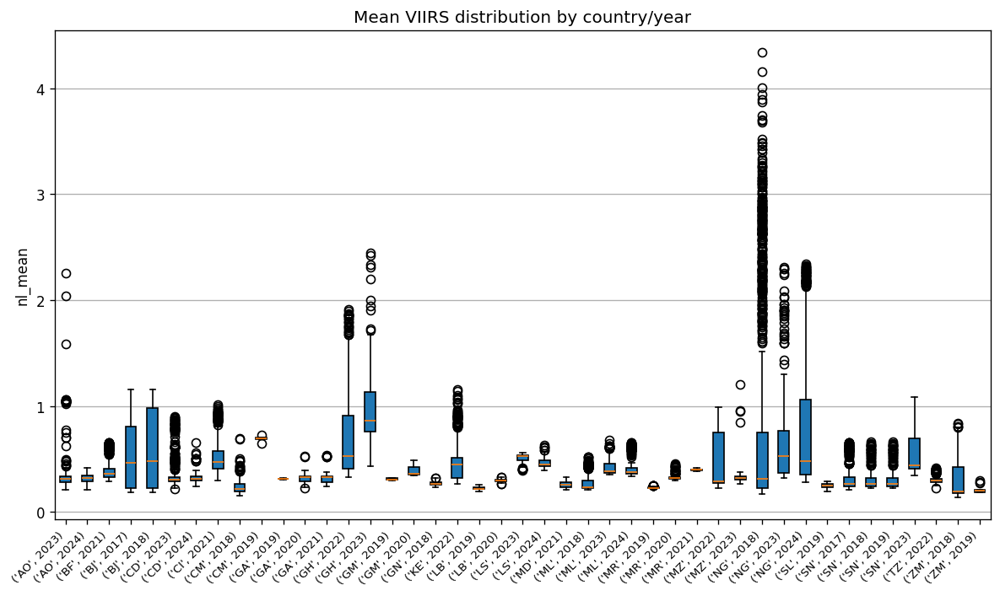

In [ ]:
# ================================================
# CELL 12 — VIIRS Nightlights Analysis
# ================================================

def boxplot_df(df_in, col, group_cols, fig_name, figsize=(10, 6), ylabel=None, title=None):
    """Box plot of column grouped by group_cols."""
    grouped = df_in.groupby(group_cols)[col].apply(list)
    labels = [f"{g}" for g in grouped.index]
    data = [v for v in grouped.values]

    fig, ax = plt.subplots(figsize=figsize)
    ax.boxplot(data, patch_artist=True)
    ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=8)
    ax.set_ylabel(ylabel or col)
    if title:
        ax.set_title(title)
    ax.grid(True, axis="y")
    savefig_dd(fig_name)
    plt.show()

viirs_mask = np.ones(len(df), dtype=bool)

boxplot_df(df[viirs_mask], "nl_center", ["country", "year"],
           fig_name="viirs_center_by_country_year.png",
           ylabel="nl_center", title="Center VIIRS distribution by country/year")

boxplot_df(df[viirs_mask], "nl_mean", ["country", "year"],
           fig_name="viirs_mean_by_country_year.png",
           ylabel="nl_mean", title="Mean VIIRS distribution by country/year")

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\viirs_nl_mean_ooc.png


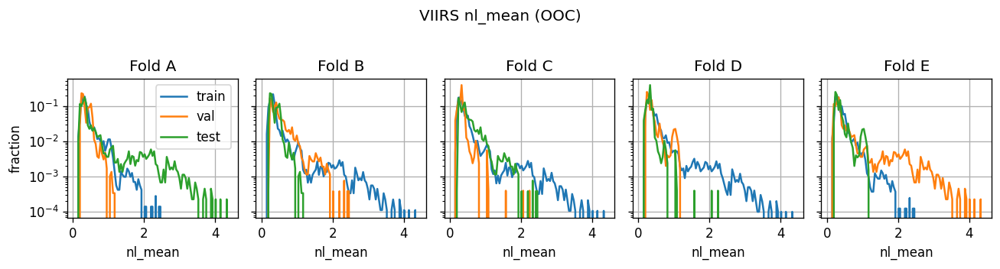

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\viirs_nl_mean_incountry.png


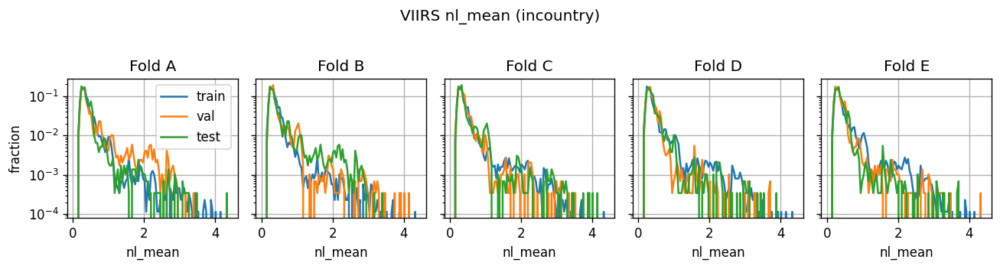

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\viirs_nl_center_ooc.png


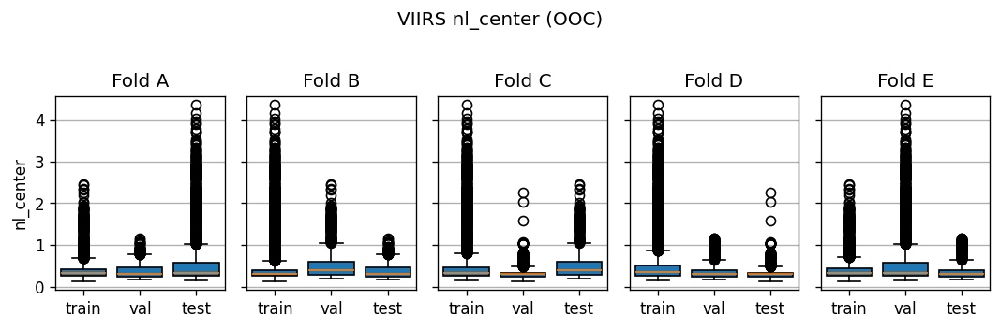

Saved figure: C:\Users\d-rosseboe\Downloads\CNN MIL\Data Distribution\viirs_nl_center_incountry.png


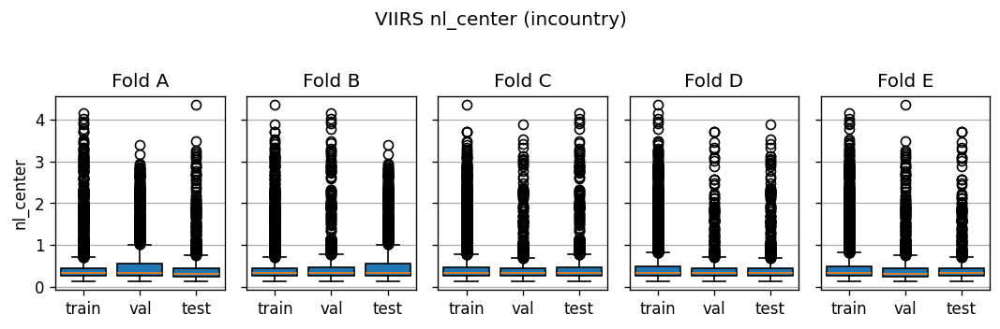

In [ ]:
# ================================================
# CELL 13 — VIIRS by Fold Analysis
# ================================================

DMSP_VIIRS_YEAR = 2012

def plot_nl_by_fold_viirs(df_in, folds, col, title, fig_name):
    fig, axs = plt.subplots(1, 5, sharey=True, figsize=(11, 2.8))
    bin_edges = np.linspace(df_in[col].min() - 0.1, df_in[col].max() + 0.1, 100)
    centers = np.convolve(bin_edges, [.5, .5], mode="valid")

    for f, ax in zip(FOLDS, axs.flat):
        for split in SPLITS:
            idx = folds[f][split]
            sub = df_in.iloc[idx]
            vals = sub.loc[sub["year"] >= DMSP_VIIRS_YEAR, col].values
            if vals.size == 0:
                continue
            hist, _ = np.histogram(vals, bins=bin_edges)
            if hist.sum() > 0:
                ax.plot(centers, hist / hist.sum(), label=split)
        ax.set_xlabel(col)
        ax.set_yscale("log")
        ax.set_title(f"Fold {f}")
        ax.grid(True)
    axs[0].legend()
    axs[0].set_ylabel("fraction")
    if title:
        fig.suptitle(title, y=1.03)
    savefig_dd(fig_name)
    plt.show()

def nl_boxplots_by_fold_viirs(df_in, folds, col, title, fig_name):
    fig, axs = plt.subplots(1, 5, sharey=True, figsize=(9, 2.8))
    for f, ax in zip(FOLDS, axs.flat):
        data = []
        for split in SPLITS:
            idx = folds[f][split]
            sub = df_in.iloc[idx]
            vals = sub.loc[sub["year"] >= DMSP_VIIRS_YEAR, col].values
            data.append(vals)
        ax.boxplot(data, patch_artist=True, widths=0.8)
        plt.setp(ax, xticks=[1, 2, 3], xticklabels=SPLITS)
        ax.set_title(f"Fold {f}")
        ax.grid(True, axis="y")
    axs[0].set_ylabel(col)
    if title:
        fig.suptitle(title, y=1.03)
    savefig_dd(fig_name)
    plt.show()

plot_nl_by_fold_viirs(df, ooc_folds, "nl_mean", "VIIRS nl_mean (OOC)", "viirs_nl_mean_ooc.png")
plot_nl_by_fold_viirs(df, incountry_folds, "nl_mean", "VIIRS nl_mean (incountry)", "viirs_nl_mean_incountry.png")
nl_boxplots_by_fold_viirs(df, ooc_folds, "nl_center", "VIIRS nl_center (OOC)", "viirs_nl_center_ooc.png")
nl_boxplots_by_fold_viirs(df, incountry_folds, "nl_center", "VIIRS nl_center (incountry)", "viirs_nl_center_incountry.png")

Loading location data and key map...
Clusters in loc_dict: 14550

Generaring 5 Top Wealth Panels...


Top Wealth:   0%|                                                                                | 0/5 [00:00<?, ?it/s]

Saved panel: panel_high_1.png


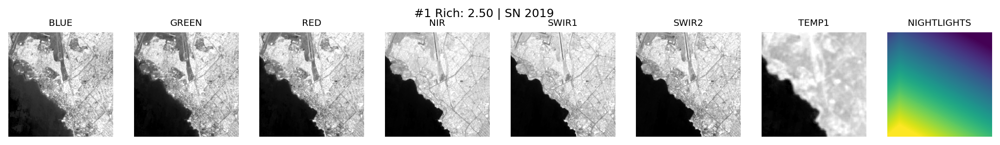

Top Wealth:  20%|██████████████▍                                                         | 1/5 [00:00<00:02,  1.76it/s]

Saved panel: panel_high_2.png


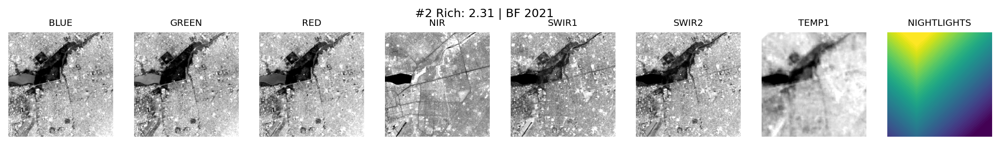

Top Wealth:  40%|████████████████████████████▊                                           | 2/5 [00:02<00:04,  1.50s/it]

Saved panel: panel_high_3.png


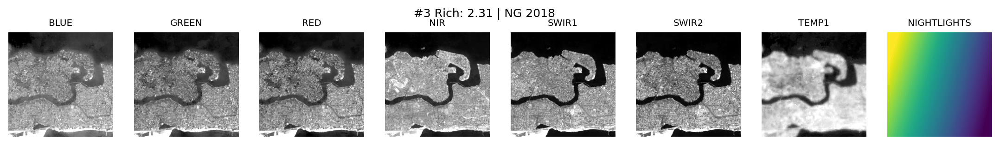

Top Wealth:  60%|███████████████████████████████████████████▏                            | 3/5 [00:27<00:24, 12.24s/it]

Saved panel: panel_high_4.png


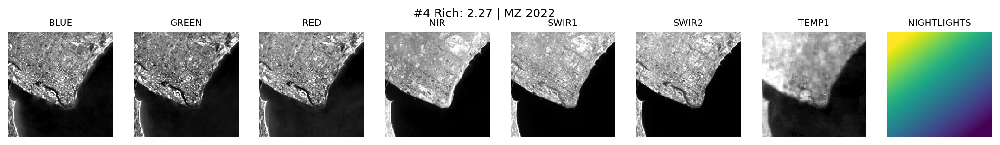

Top Wealth:  80%|█████████████████████████████████████████████████████████▌              | 4/5 [00:32<00:09,  9.25s/it]

Saved panel: panel_high_5.png


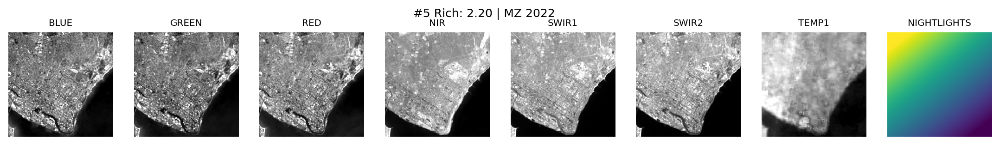

Top Wealth: 100%|████████████████████████████████████████████████████████████████████████| 5/5 [00:34<00:00,  6.99s/it]



Generaring 5 Low Wealth Panels...


Low Wealth:   0%|                                                                                | 0/5 [00:00<?, ?it/s]

Saved panel: panel_low_1.png


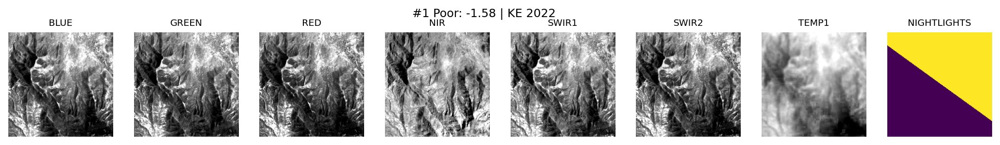

Low Wealth:  20%|██████████████▍                                                         | 1/5 [00:10<00:43, 10.85s/it]

Saved panel: panel_low_2.png


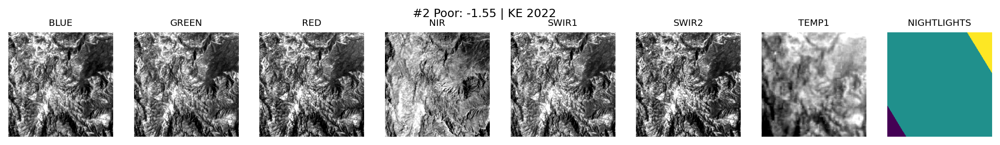

Low Wealth:  40%|████████████████████████████▊                                           | 2/5 [00:16<00:22,  7.62s/it]

Saved panel: panel_low_3.png


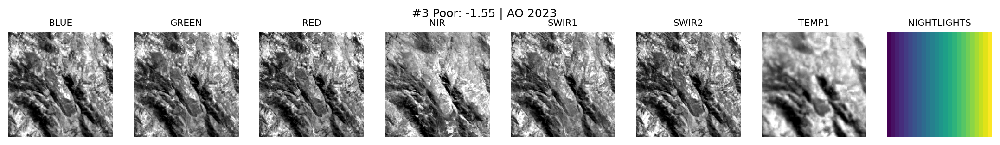

Low Wealth:  60%|███████████████████████████████████████████▏                            | 3/5 [00:21<00:13,  6.61s/it]

Saved panel: panel_low_4.png


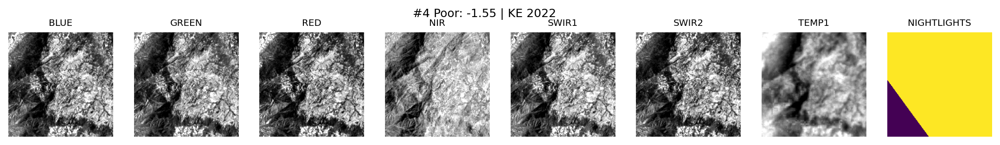

Low Wealth:  80%|█████████████████████████████████████████████████████████▌              | 4/5 [00:27<00:06,  6.14s/it]

Saved panel: panel_low_5.png


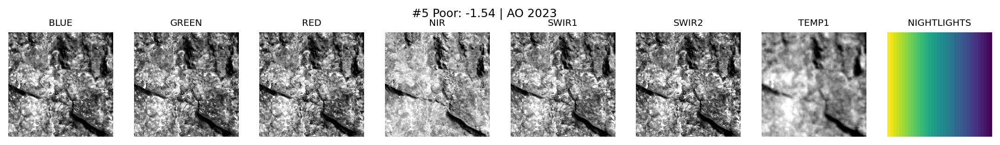

Low Wealth: 100%|████████████████████████████████████████████████████████████████████████| 5/5 [00:35<00:00,  7.01s/it]


Done.


In [ ]:
# ================================================
# CELL 15 — Panels: Top/Bottom Wealth Examples (ROBUST)
# ================================================

# Ensure output directory exists
DD_DIR.mkdir(parents=True, exist_ok=True)
if not MAKE_PANELS:
    print("MAKE_PANELS=False; skipping.")
else:
    # 1. Load Data
    # We define paths if they aren't already in scope
    LOC_DICT_PATH = DD_DIR / "loc_dict.pkl"
    KEYMAP_PKL = DD_DIR / "tfrecord_key_to_path.pkl"

    if not (LOC_DICT_PATH.exists() and KEYMAP_PKL.exists()):
        print("⚠️ Missing LOC_DICT or KEYMAP. Skipping panels.")
        print(f"Check {LOC_DICT_PATH} and {KEYMAP_PKL}")
    else:
        print("Loading location data and key map...")
        loc_dict = pickle.loads(LOC_DICT_PATH.read_bytes())
        key_to_path = pickle.loads(KEYMAP_PKL.read_bytes())

        # 2. Build Cluster Table
        rows = []
        for (cc, yr, clu), v in loc_dict.items():
            rows.append({
                "country": str(cc).upper()[:2],
                "year": int(yr),
                "cluster": int(clu),
                "lat": float(v["lat"]),
                "lon": float(v["lon"]),
                "wealthpooled": float(v["wealthpooled"]),
            })

        cluster_df = pd.DataFrame(rows).drop_duplicates(
            subset=["country", "year", "cluster"]
        ).reset_index(drop=True)
        print(f"Clusters in loc_dict: {len(cluster_df)}")

        # 3. Define Image Fetcher (Robust to missing index)
        def fetch_cluster_image_robust(key):
            """
            Fetches image for (Country, Year, Cluster).
            Scans the file if 'index' is missing from the map.
            """
            target_cc, target_yr, target_clu = key

            entry = key_to_path.get(key)
            if entry is None:
                print(f"Key {key} not found in key_to_path map.")
                return None

            tf_path = entry.get("path")
            if not tf_path:
                # Handle case where entry might be just the path string
                if isinstance(entry, str):
                    tf_path = entry
                else:
                    print(f"Invalid entry structure for {key}: {entry}")
                    return None

            # Check if we have a direct index (Fast Mode)
            target_idx = entry.get("index")

            # Parse dataset
            dataset = tf.data.TFRecordDataset(tf_path)

            found_img = None

            for i, raw_record in enumerate(dataset):
                # If we have an index, only parse that one
                if target_idx is not None:
                    if i != target_idx:
                        continue

                # Parse the record
                example = parse_tfrecord(raw_record)

                # Check identity if we didn't have an index (Slow Mode)
                if target_idx is None:
                    rec_cc = example["country"].numpy().decode("utf-8").upper()[:2]
                    rec_yr = int(example["year"].numpy())
                    rec_clu = int(example["cluster"].numpy())

                    if (rec_cc, rec_yr, rec_clu) != key:
                        continue

                # --- Build Image ---
                K = int(example["K"].numpy())
                H = int(example["patch_size"].numpy())

                img = np.zeros((H, H, len(BANDS_ALL)), dtype=np.float32)
                for band_idx, band in enumerate(BANDS_ALL):
                    arr = tf.sparse.to_dense(example[band]).numpy()
                    if arr.size == K * H * H:
                        cube = arr.reshape(K, H, H)
                        # Center patch is usually index 4 for K=9
                        center_idx = K // 2
                        img[:, :, band_idx] = cube[center_idx]

                found_img = img
                break # Found it, stop scanning

            return found_img

        # 4. Helper to Save/Display
        def _save_and_embed(fig, save_name):
            out_path = DD_DIR / save_name
            fig.savefig(out_path, dpi=180, bbox_inches="tight")
            print("Saved panel:", out_path.name)
            try:
                if _NBImage is not None:
                    buf = io.BytesIO()
                    fig.savefig(buf, format="png", dpi=180, bbox_inches="tight")
                    buf.seek(0)
                    _nbdisplay(_NBImage(data=buf.getvalue()))
            except:
                pass
            plt.close(fig)

        def plot_image_by_band(img, title, save_name):
            if img is None: return
            k = len(BAND_ORDER)
            fig, axes = plt.subplots(1, k, figsize=(1.9 * k, 1.9))
            axes = np.atleast_1d(axes).ravel()

            for i, b in enumerate(BAND_ORDER):
                try:
                    idx = BANDS_ALL.index(b)
                    chan = img[:, :, idx]

                    # Normalize for display (clip 0-1ish for optical, different for others)
                    # Simple min-max per band for visualization
                    vmin, vmax = np.percentile(chan[np.isfinite(chan)], [2, 98])
                    axes[i].imshow(chan, vmin=vmin, vmax=vmax, cmap='viridis' if b=='NIGHTLIGHTS' else 'gray')
                except:
                    pass # Handle missing/empty bands gracefully

                axes[i].set_title(b, fontsize=8)
                axes[i].axis("off")

            fig.suptitle(title, fontsize=10)
            _save_and_embed(fig, save_name)

        # 5. Generate Panels
        labels = cluster_df["wealthpooled"].values
        # Top Wealth
        top_idx = np.argsort(labels)[::-1][:K_PANELS]
        # Low Wealth
        low_idx = np.argsort(labels)[:K_PANELS]

        print(f"\nGeneraring {K_PANELS} Top Wealth Panels...")
        for rank, idx in enumerate(tqdm(top_idx, desc="Top Wealth"), start=1):
            r = cluster_df.iloc[int(idx)]
            key = (r["country"], int(r["year"]), int(r["cluster"]))

            img = fetch_cluster_image_robust(key)
            if img is not None:
                title = (f"#{rank} Rich: {r['wealthpooled']:.2f} | {r['country']} {int(r['year'])}")
                plot_image_by_band(img, title, f"panel_high_{rank}.png")

        print(f"\nGeneraring {K_PANELS} Low Wealth Panels...")
        for rank, idx in enumerate(tqdm(low_idx, desc="Low Wealth"), start=1):
            r = cluster_df.iloc[int(idx)]
            key = (r["country"], int(r["year"]), int(r["cluster"]))

            img = fetch_cluster_image_robust(key)
            if img is not None:
                title = (f"#{rank} Poor: {r['wealthpooled']:.2f} | {r['country']} {int(r['year'])}")
                plot_image_by_band(img, title, f"panel_low_{rank}.png")

print("\nDone.")